In [1]:
import warnings
import time
warnings.filterwarnings("ignore")
import numpy as np
import re
import pandas as pd    
import scipy.stats as stats
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import os
from os import system
from IPython.display import Image
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
import graphviz

***
***

## QUESTION 1

<br>

### **SOLUTION (1 A.)**

In [2]:
telecom_data_1 = pd.read_csv("C:/Users/pri96/OneDrive/Documents/AI and ML PGP/Week 14 to Week 16 - Ensemble Techmiques/Project/TelcomCustomer-Churn_1.csv")
telecom_data_1.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No


In [3]:
telecom_data_1.shape

(7043, 10)

### **SOLUTION (1 B.)**

In [4]:
telecom_data_2 = pd.read_csv("C:/Users/pri96/OneDrive/Documents/AI and ML PGP/Week 14 to Week 16 - Ensemble Techmiques/Project/TelcomCustomer-Churn_2.csv")
telecom_data_2.head()

,customerID,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [5]:
telecom_data_2.shape

(7043, 12)

### **SOLUTION (1 C.)**

In [6]:
telecom = pd.merge(telecom_data_1, telecom_data_2, on = 'customerID', how = 'inner')
print("\nMerged Dataframe --->")
telecom.head()


Merged Dataframe --->


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [7]:
telecom.shape

(7043, 21)

### **SOLUTION (1 D.)**

In [8]:
telecom_data_1_columns = set(telecom_data_1.columns)
telecom_data_2_columns = set(telecom_data_2.columns)

# Combining set of columns of both dataframes above 
combined_columns_in_1_and_2 = telecom_data_1_columns.union(telecom_data_2_columns)

# Verifying if all columns of telecom_data_1 and telecom_data_2 are combined to telecom dataframe using set comparison operator
if_columns_merged_successfully = combined_columns_in_1_and_2 <= set(telecom.columns)

print("Shape of first dataframe is",  telecom_data_1.shape)
print("Shape of second dataframe is",  telecom_data_2.shape)
print("\nShape of merged dataframe is",  telecom.shape)
print("\nAre all columns merged successfully from telecom 1 and telecom 2 to combined telecom dataframe? -", if_columns_merged_successfully)

Shape of first dataframe is (7043, 10)
Shape of second dataframe is (7043, 12)

Shape of merged dataframe is (7043, 21)

Are all columns merged successfully from telecom 1 and telecom 2 to combined telecom dataframe? - True


***
***

## QUESTION 2

<br>

### **SOLUTION (2 A.)**

In [9]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [10]:
telecom.head(10).transpose()

,0,1,2,3,4,5,6,7,8,9
customerID,7590-VHVEG,5575-GNVDE,3668-QPYBK,7795-CFOCW,9237-HQITU,9305-CDSKC,1452-KIOVK,6713-OKOMC,7892-POOKP,6388-TABGU
gender,Female,Male,Male,Male,Female,Female,Male,Female,Female,Male
SeniorCitizen,0,0,0,0,0,0,0,0,0,0
Partner,Yes,No,No,No,No,No,No,No,Yes,No
Dependents,No,No,No,No,No,No,Yes,No,No,Yes
tenure,1,34,2,45,2,8,22,10,28,62
PhoneService,No,Yes,Yes,No,Yes,Yes,Yes,No,Yes,Yes
MultipleLines,No phone service,No,No,No phone service,No,Yes,Yes,No phone service,Yes,No
InternetService,DSL,DSL,DSL,DSL,Fiber optic,Fiber optic,Fiber optic,DSL,Fiber optic,DSL
OnlineSecurity,No,Yes,Yes,Yes,No,No,No,Yes,No,Yes


> We see that TotalCharges column is supposed to be of type float however it is of type object. This means there are some values invalid/incorrect values in TotalCharges column which need to be identified and corrected.
> <br> Let's check for empty strings, if any?

In [11]:
telecom[telecom['TotalCharges'] == ' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


> As we see, though we do not have any blank values for TotalCharges, we have a few records where there's a space character added in place of actual value.
<br>These are the records where customers are newly joined.
<br>We can impute these values with:
 > 1. either 0 (since these are newly joined customers and would not ideally have any total charges yet)
 > 2. or median (would've filled it with mode if it would be a categorical variable)
>
> Both the scenarios can be considered for this however, we will be going with imputing them with the median because it is the ideal approach here. Reasons being:
> 1. This is numerical data so filling with mode would be an unfair choice as mode is imputed for categorical data
> 2. It will be less affected by outliers if we impute by median and not by mode or 0 value
> 3. This approach won't result in unfair skewness of data

In [12]:
telecom['TotalCharges'] = telecom['TotalCharges'].replace(' ', np.nan)
telecom.isna().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [13]:
telecom['TotalCharges'] = telecom['TotalCharges'].fillna(telecom['TotalCharges'].median())

In [14]:
# All records where TotalCharges were empty had tenure as 0. Therefore,
telecom[telecom['tenure'] == 0]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,1397.475,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,1397.475,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,1397.475,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,1397.475,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,1397.475,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,1397.475,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,1397.475,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,1397.475,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,1397.475,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,1397.475,No


### **SOLUTION (2 B.)**

In [15]:
continuous_values = ['tenure', 'MonthlyCharges', 'TotalCharges']
for column in continuous_values:
    telecom[column] = telecom[column].astype(float)
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   float64
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


> Now all continuous values are converted to float type.
> 
> There is 1 more column with an incorrect datatype, SeniorCitizen. though this is categorical column, it is of type int. Let's convert it to categorical type column

In [16]:
telecom['SeniorCitizen'] = telecom['SeniorCitizen'].astype('object')

In [17]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   float64
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


>Now all columns are of appropriate data-types. Let's move forward

### **SOLUTION (2 C.)**

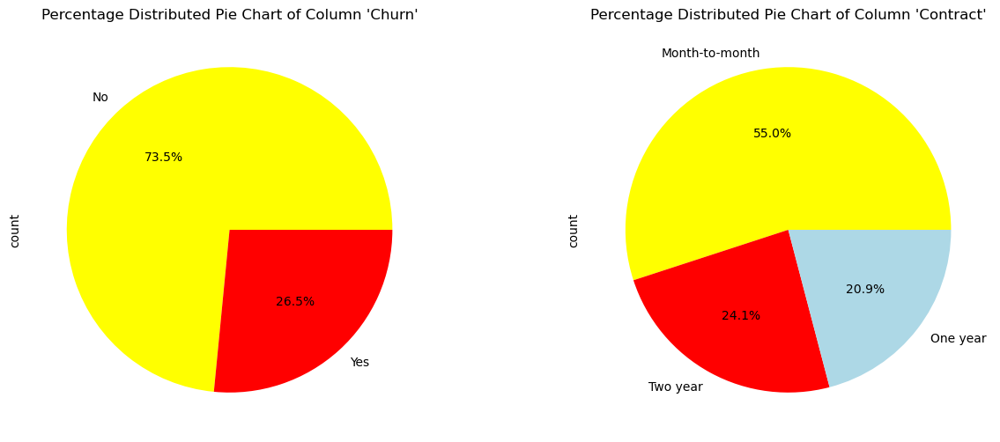

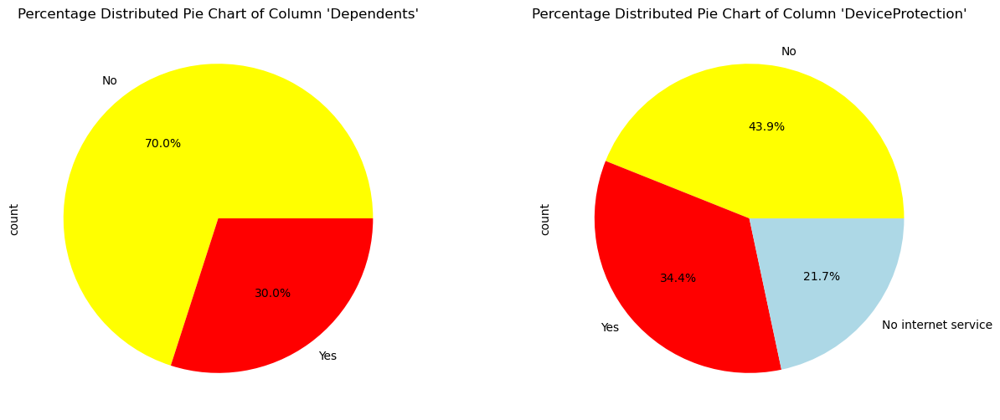

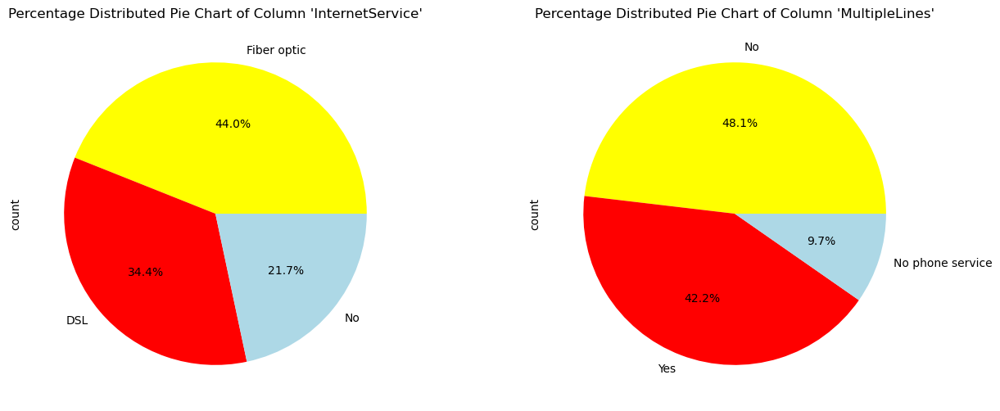

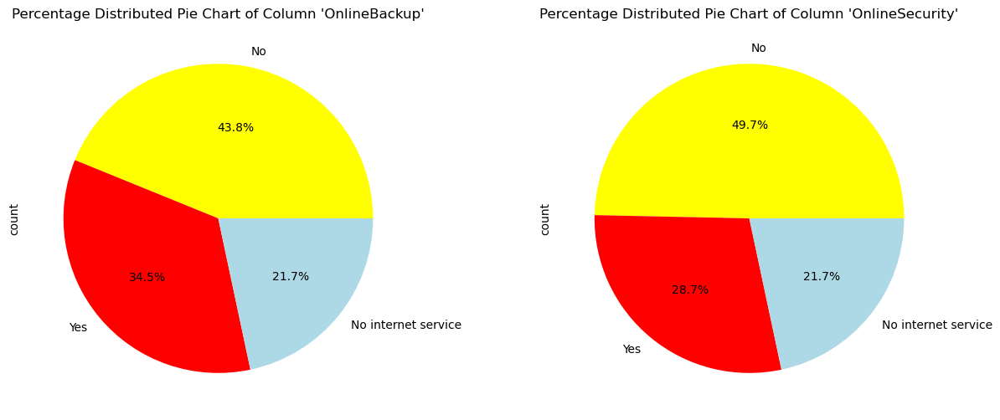

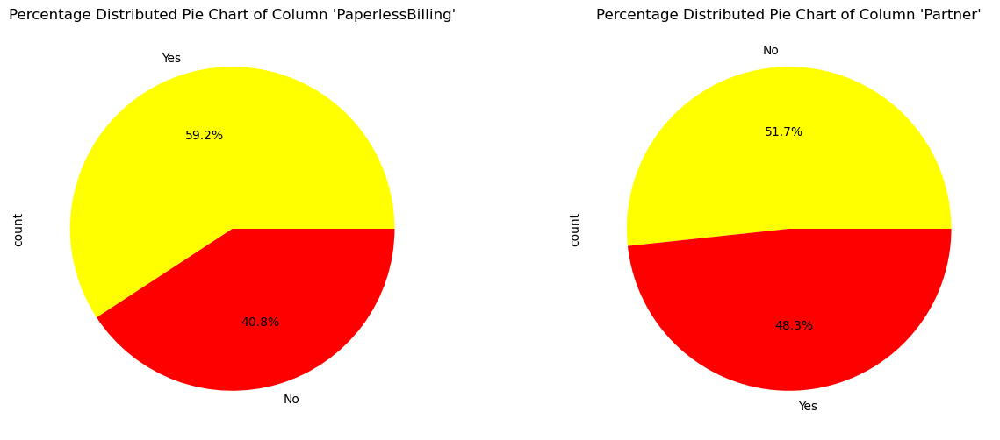

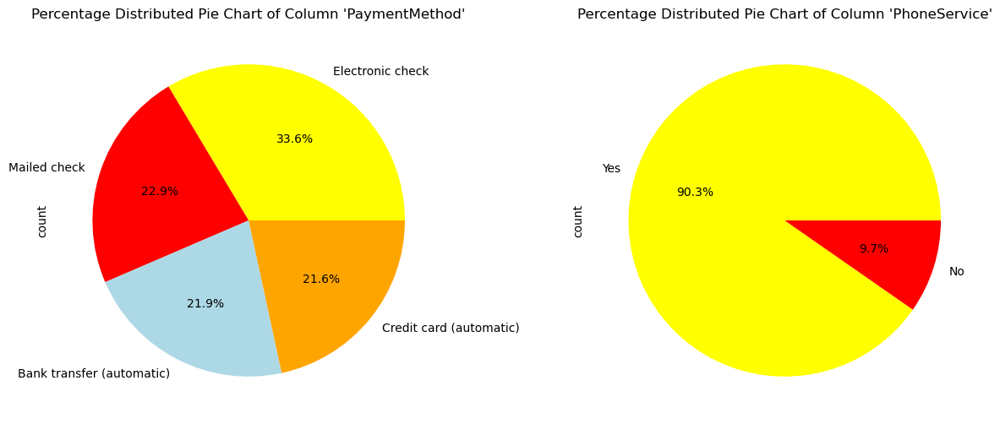

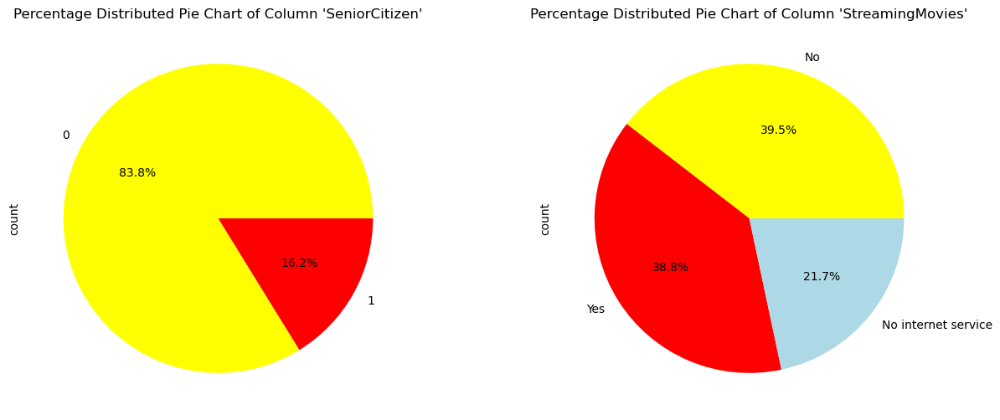

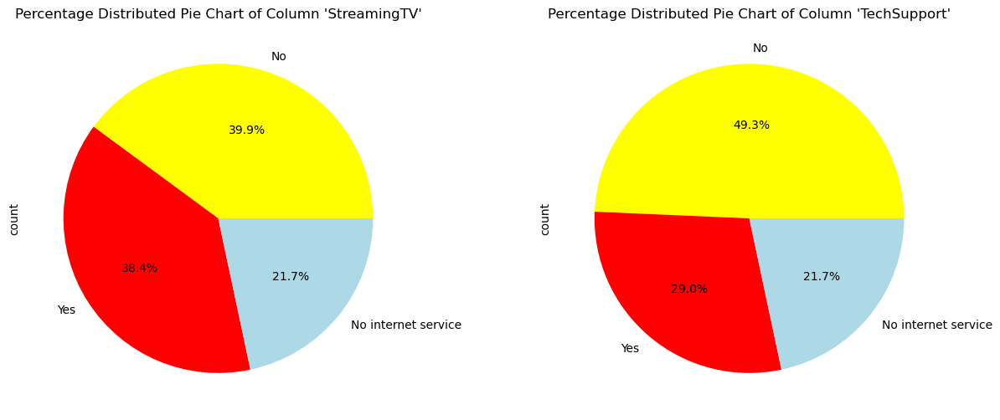

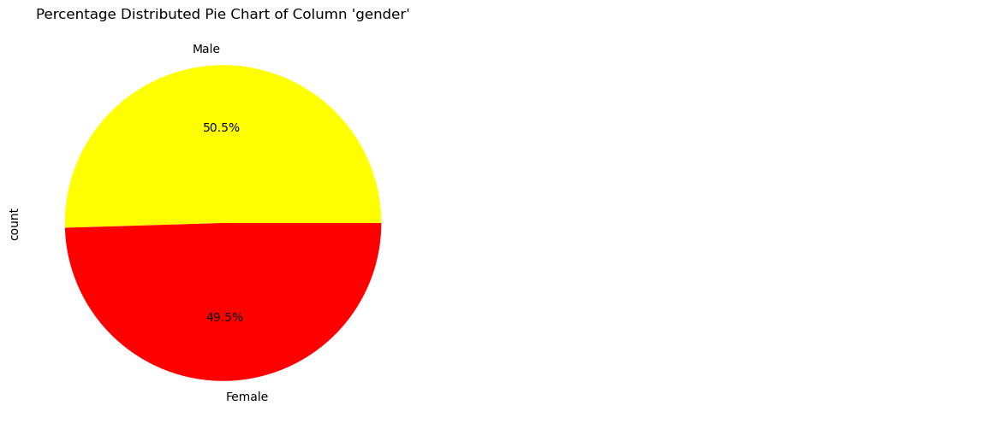

In [18]:
def pie_Chart_For_Categorical_Columns(dataframe):
    """
    Generates a pie chart for each categorical column
    along with percentage distributions
    Parameters:
    dataframe: The required dataframe as input
    """
    
    # get all categorical columns
    categorical_columns = dataframe.select_dtypes(include = ['object']).columns.difference(['customerID'])
    
    i = 0
    while i < len(categorical_columns):
        column = categorical_columns[i]
        fig, axes = plt.subplots(1, 2, figsize = (15, 6))
        column_value_counts = dataframe[column].value_counts()
        colors = ['yellow', 'red', 'lightblue', 'orange']
        
        # Plot first pie chart
        column_value_counts.plot.pie(labels = column_value_counts.index, autopct = '%1.1f%%', labeldistance = 1.1, colors = colors, ax = axes[0])
        axes[0].set_title(f"Percentage Distributed Pie Chart of Column '{column}'")
        
        # Increment i
        i += 1
        
        if i < len(categorical_columns):
            column = categorical_columns[i]
            column_value_counts = dataframe[column].value_counts()
            
            # Plot second pie chart
            column_value_counts.plot.pie(labels = column_value_counts.index, autopct = '%1.1f%%', labeldistance = 1.1, colors = colors, ax = axes[1])
            axes[1].set_title(f"Percentage Distributed Pie Chart of Column '{column}'")
            
            # Increment i
            i += 1
        else:
            axes[1].axis('off')  # Turn off the second subplot if there is no next column
        
        plt.show()

pie_Chart_For_Categorical_Columns(telecom)

### **SOLUTION (2 D.)**

The pie charts display the percentage distribution of various categorical features among the customers associated with the company
 1. **Internet Service:** *DSL (34.4%), Fiber optic (42.8%), No internet service (22.7%)*
     * We see highest distribution of 42.8% for customer opting for Fibre Optic service which indicates that a bigger proportion of customers have demand for faster internet
     * However, fiber optic users may also face higher costs, leading to potential churn if the service does not meet expectations
     * With 34.4% distribution, DSL is also popular among a set of customers and a less percentage of around 23% customers do not take any internet services
     <br><br>
 2. **Multiple Lines:** *No (48.6%), Yes (24.9%), No phone service (26.5%)*
     * There are only (1/4)th set of customer who have opted for multiple line service, suggesting single line service plans are more popular among users
     * This also comes with a fact that customers with multiple lines might face higher bills which increases the risk of churn
     <br><br>
 3. **Online Security:** *No (49.3%), Yes (29.7%), No internet service (21.0%)*
     * The percentage of customers opting for online security is very less. This can coincide with the fact that this additional service comes with extra cost which does not satisfy most customers
     * Almost half of the customers (49.3%) do not have online security, which might lead to dissatisfaction and churn if security issues arise
     * It can be advised to Offer bundled security services to customers to improve retention and have more customer join the pack
     <br><br>
 4. **Online Backup:** *No (43.4%), Yes (35.6%), No internet service (21.0%)*
     * There is a considersable amount of customeer not opting for online backup services
     * Company could promote the benefits of online backup and and offer them at a competitive price with discounts to existing ones to pull more customers and reduce churn
     <br><br>
 5. **Device Protection:** *No (46.1%), Yes (32.8%), No internet service (21.0%)*
     * Nearly half of the customers do not have device protection
     * Company could benefit from highlighting the advantages of device protection and earn more sign-ups
     <br><br>
 6. **Tech Support:** *No (41.1%), Yes (37.9%), No internet service (21.0%)*
     * There is a good proportion of customer using tech support which idicates it's importance
     * There is always a room for improvement with 41% customer not opting for it. Enhancing the quality of tech support can improve customer satisfaction and retention
     <br><br>
 7. **Streaming TV:** *No (39.4%), Yes (39.5%), No internet service (21.0%)*
     * There seems to be a balanced distribution across customer opting and not opting for this service
     * Company needs to focus more on providing high-quality streaming content and addressing any service issues promptly to retain customers
     <br><br>
 8. **Streaming Movies:** *No (38.8%), Yes (40.2%), No internet service (21.0%)*
     * Similar to Streaming TV, this laso has a balanced distribution and ensuring a vast library of movies and TV shows can aid customer retention
     <br><br>
 9. **Contract:** *Month-to-month (55.0%), One year (19.9%), Two years (24.9%)*
     * We see from the distribution that a major proportion of customers are on month-to-month contract with the company
     * This is a more flexible plan but also has an easy exit for customers. It also somewhere shows a lack of trust on long term services from the company
     * There seems to be a focus area on improving customer satisfaction with engaging offers and incentives to keep them associated for longer duration
     <br><br>
 10. **Paperless Billing:** *No (40.1%), Yes (59.9%)*
     * Most customers prefer paperless billing however those not opting for it also seems to be a good percentage. This makes sense as company has different generations from younger to middle age to older associated to it
     * Ensuring the process in user friendly is the key to attact more customers into it
     <br><br>
 11. **Phone Service:** *No (9.7%), Yes (90.3%)*
     * Majority of customers are awailing the phone services which makes sense as it is the base of the company
     <br><br>
 12. **Gender:** *Male (50.5%), Female (49.5%)*
     * Gender distribution is almost equal, indicating no significant impact on churn based on gender alone
     <br><br>
 13. **Dependents:** *No (70.5%), Yes (29.5%)*
     * Customers without dependents are more prevalent
     * Company can introduce family plans and offers tailored to customers with dependents to increase engagement
     <br><br>
 14. **Senior Citizens:** *No (83.8%), Yes (16.2%)*
     * Senior citizens represent a very small segment but they may be more sensitive to price and service quality
     * Along with family plans, company can also introduce senior friendly plans and discounts
     <br><br>
 15. **Partner:** *No (48.1%), Yes (51.7%)*
     * Customers with partners slightly outnumber those without them
     * Promoting couple or family plans could improve satisfaction
     <br><br>
 
 **Few recomendations to reduce churn and improve customer satisfaction**
 * The company can focus more on improving reliability and speed, especially for fiber optic users. ALso, DSL service users should be a target to the company to offer cost-effective packages and incentives so they plan to upgrade to Fibre Optic services
 * Promote value added services for online backup, online security and device protection. These can be introduced as bundle services to increase customer engagement and reduce churn
 * Easy access to tech support for troubleshoorting and assist customers effectively is a good improvement area
 * Again, offering bundles services and subscriptions for customers opting for multiple streaming services will pull more customers
 * Providing insentives and added services to customers with long-term contracts and encouraging customers from month-to-month service to upgrade to longer plans with attractive offers
 * Developing family and senior citizen plans with better value and having more tailored package for customers with dependents
 * Conducting surveys and feedback forms to tailor services and improve satisfaction

>Along with pie chart analysis, let's also perform analysis on various numerical variables as well so that we know more of the dataframe

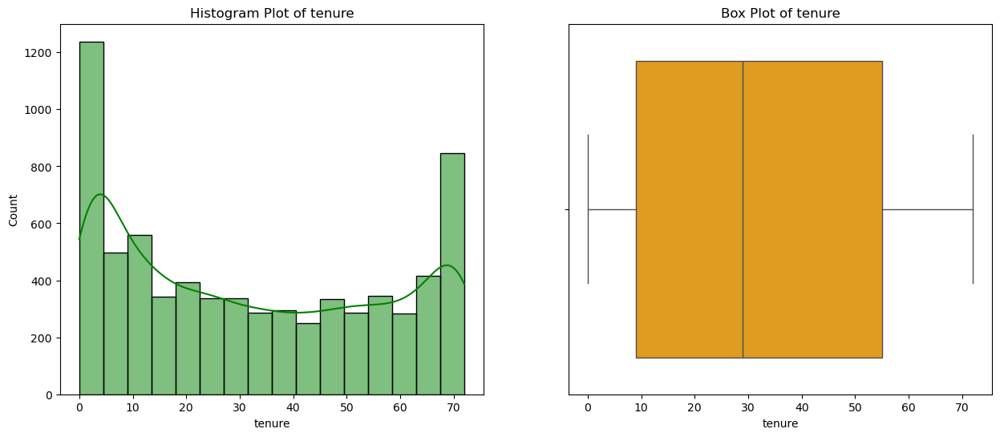

Total Number of outliers in column 'tenure': 0


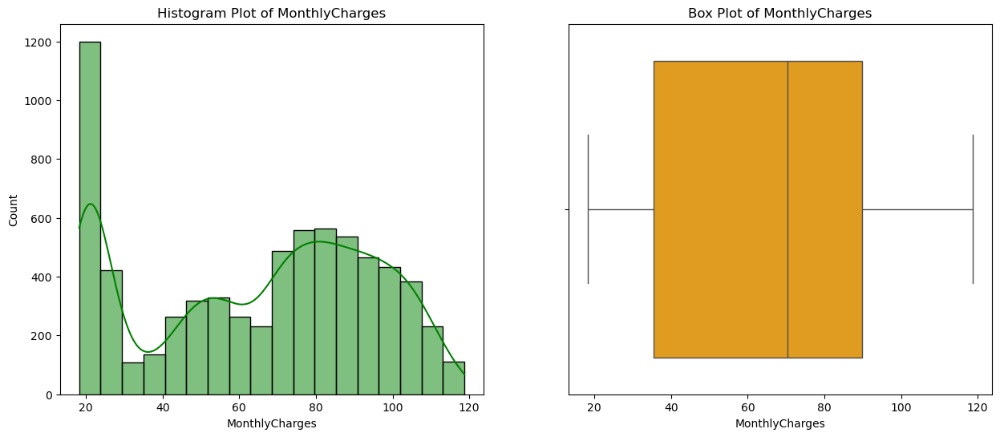

Total Number of outliers in column 'MonthlyCharges': 0


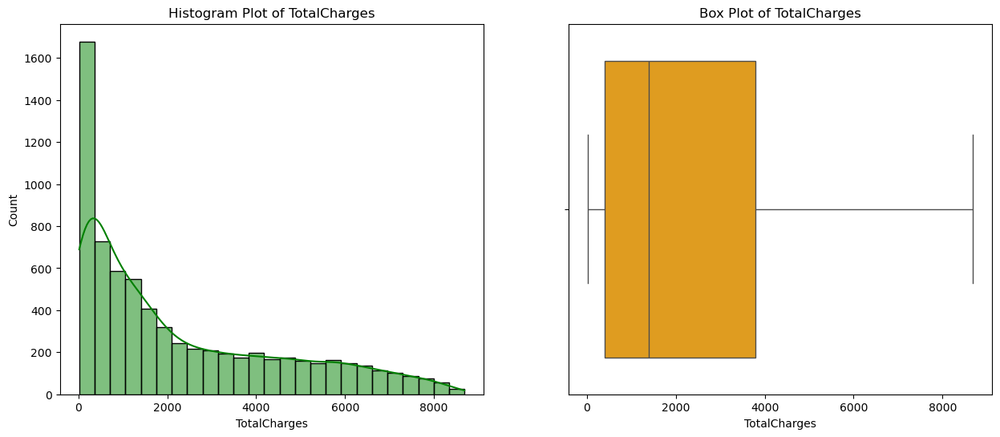

Total Number of outliers in column 'TotalCharges': 0


In [19]:
for i in telecom.select_dtypes(['float64']).columns:
    
    fig, axes = plt.subplots(1, 2, figsize=(15,6))
    sns.histplot(telecom[i], kde = True, ax = axes[0], color = 'Green')
    axes[0].set_title('Histogram Plot of {}'.format(i))
    
    sns.boxplot(data = telecom, x = i, orient='h', ax = axes[1], color = "Orange")
    axes[1].set_title('Box Plot of {}'.format(i))
    
    plt.show()
    
    #checking count of outliers.
    q25, q75 = np.percentile(telecom[i], 25), np.percentile(telecom[i], 75)
    IQR = q75 - q25
    threshold = IQR * 1.5
    lower, upper = q25 - threshold, q75 + threshold
    
    Outliers = [i for i in telecom[i] if i < lower or i > upper]
    print(f"Total Number of outliers in column '{i}': {len(Outliers)}")



We can see with above plots that:
 1. Data is not normally distributed
 2. We do not have any outliers in the data indicating the data given by the company is closer to accuracy
 3. There is a positive skewness observed for TotalCharges whereas tenure and MonthlyCharges show no skewness as such

### **SOLUTION (2 E.)**

>Before we proceed with encoding, let's drop 'customerId' column as it is not contributing much to the analysis as to what the ID of the customer is.
>
>But before that, let's check for any duplicates in the dataset

In [20]:
duplicate_rows = telecom[telecom.drop(columns = 'customerID', axis = 1).duplicated(keep = False)].sort_values(by = list(telecom.drop(columns = 'customerID', axis = 1).columns))
duplicate_rows.head(duplicate_rows.shape[0]).transpose()

,6491,6764,4495,6267,5522,5759,542,1491,5170,6774,...,3312,6499,2121,2892,3679,6609,2033,4098,690,2713
customerID,9728-FTTVZ,7660-HDPJV,4702-IOQDC,0328-GRPMV,2619-WFQWU,9985-MWVIX,2866-IKBTM,8605-ITULD,7721-DVEKZ,0970-QXPXW,...,9122-UMROB,2676-ISHSF,0673-IGUQO,2668-TZSPS,1240-KNSEZ,1000-AJSLD,8305-VHZBZ,5356-RHIPP,8262-COGGB,5996-DAOQL
gender,Female,Female,Female,Female,Female,Female,Female,Female,Female,Female,...,Male,Male,Male,Male,Male,Male,Male,Male,Male,Male
SeniorCitizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Partner,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
Dependents,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
tenure,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
PhoneService,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
MultipleLines,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
InternetService,Fiber optic,Fiber optic,Fiber optic,Fiber optic,Fiber optic,Fiber optic,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
OnlineSecurity,No,No,No,No,No,No,No internet service,No internet service,No internet service,No internet service,...,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service


>As we see, there are 42 duplicate rows with exact same data across with the customerID as the distinguishing factor among them. >We see 2 options here:
> 1. either we drop 'customerID' column and then remove these duplicates from our dataframe considering them as actual duplicate rows for same customer
> 2. or we consider the exact duplicate rows as coincidences for different customers sharing the same data across and differenciate them with the ID column
> 
> But as discussed above, we are going to drop 'customerID' column anyway as it is not of much significance to the further analysis, we will be going with option 1 and remove the duplicates

In [21]:
# Dropping 'costomerID' column
telecom.drop(columns = 'customerID', axis = 1, inplace = True)

# Dropping duplicate rows and keeping only the first occurrence
telecom.drop_duplicates(keep = 'first', inplace = True)
telecom.shape

(7021, 20)

>Now that duplicate values are dropped from the dataframe, let's proceed with encoding

In [22]:
print("\nUnique Values in Columns --> ")
for column in telecom.select_dtypes(include = ['object']).columns:
        unique_values = telecom[column].unique()
        print(f" '{column}': {unique_values}")


Unique Values in Columns --> 
 'gender': ['Female' 'Male']
 'SeniorCitizen': [0 1]
 'Partner': ['Yes' 'No']
 'Dependents': ['No' 'Yes']
 'PhoneService': ['No' 'Yes']
 'MultipleLines': ['No phone service' 'No' 'Yes']
 'InternetService': ['DSL' 'Fiber optic' 'No']
 'OnlineSecurity': ['No' 'Yes' 'No internet service']
 'OnlineBackup': ['Yes' 'No' 'No internet service']
 'DeviceProtection': ['No' 'Yes' 'No internet service']
 'TechSupport': ['No' 'Yes' 'No internet service']
 'StreamingTV': ['No' 'Yes' 'No internet service']
 'StreamingMovies': ['No' 'Yes' 'No internet service']
 'Contract': ['Month-to-month' 'One year' 'Two year']
 'PaperlessBilling': ['Yes' 'No']
 'PaymentMethod': ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
 'Churn': ['No' 'Yes']


>To encode the categorical features in the given dataframe, we can go with below approaches:
> 1. **Level Encoding -** We'll be doing it on 'Contract' column as it is an ordinal type, with a clear ranking of *Month-to-Month < One Year < Two Year*, and level encoding fits best on ordinal type data. We will be encoding 'Month-to-Month' value with 0, 'One Year' with '1' and 'Two Year' with a value of 2
> 2. **One-Hot Encoding -** We can perform this on rest of the categorical columns as all the other columns do not have any inherent order and one-hot encoding will treat each category independently here
> 3. **Manual Encoding -** This feels to be a better approach for categorical variables here as we have less than 5 unique values for each categorical data so it will be easy to implement. Also, we will handle less number of columns compared to one-hot encoding and will be easier to handle data as well
 >
>*Seeing above options, we'll conclude to go with level encoding for 'Contract' column and manual encoding for rest of the columns*
 >
>Let's move ahead with the code.

In [23]:
# Label Encoding for 'Contract' column

# initializing label encoder
label_encoder = LabelEncoder()

# label encoding for 'Contract' column
telecom['Contract'] = label_encoder.fit_transform(telecom['Contract'])
telecom['Contract'] = telecom['Contract'].astype('int64')

telecom.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1.0,No,No phone service,DSL,No,Yes,No,No,No,No,0,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34.0,Yes,No,DSL,Yes,No,Yes,No,No,No,1,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,0,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45.0,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,1,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,0,Yes,Electronic check,70.70,151.65,Yes


In [24]:
# Manual Encoding for other columns

telecom['gender'].replace(['Male','Female'],[0,1],inplace=True)

# 'SeniorCitizen' column is already in it's best encoded form, so skipped it
# We'll still change the data type of the column to int
telecom['SeniorCitizen'] = telecom['SeniorCitizen'].astype('int64')

telecom['Partner'].replace(['Yes','No'],[1,0],inplace=True)
telecom['Dependents'].replace(['Yes','No'],[1,0],inplace=True)
telecom['PhoneService'].replace(['Yes','No'],[1,0],inplace=True)
telecom['MultipleLines'].replace(['No phone service','No', 'Yes'],[0,0,1],inplace=True)
telecom['InternetService'].replace(['No','DSL','Fiber optic'],[0,1,2],inplace=True)
telecom['OnlineSecurity'].replace(['No','Yes','No internet service'],[0,1,0],inplace=True)
telecom['OnlineBackup'].replace(['No','Yes','No internet service'],[0,1,0],inplace=True)
telecom['DeviceProtection'].replace(['No','Yes','No internet service'],[0,1,0],inplace=True)
telecom['TechSupport'].replace(['No','Yes','No internet service'],[0,1,0],inplace=True)
telecom['StreamingTV'].replace(['No','Yes','No internet service'],[0,1,0],inplace=True)
telecom['StreamingMovies'].replace(['No','Yes','No internet service'],[0,1,0],inplace=True)
telecom['PaperlessBilling'].replace(['Yes','No'],[1,0],inplace=True)
telecom['PaymentMethod'].replace(['Electronic check', 'Mailed check', 'Bank transfer (automatic)','Credit card (automatic)'],[0,1,2,3],inplace=True)
telecom['Churn'].replace(['Yes','No'],[1,0],inplace=True)

telecom.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,1,0,1,0,1.0,0,0,1,0,1,0,0,0,0,0,1,0,29.85,29.85,0
1,0,0,0,0,34.0,1,0,1,1,0,1,0,0,0,1,0,1,56.95,1889.50,0
2,0,0,0,0,2.0,1,0,1,1,1,0,0,0,0,0,1,1,53.85,108.15,1
3,0,0,0,0,45.0,0,0,1,1,0,1,1,0,0,1,0,2,42.30,1840.75,0
4,1,0,0,0,2.0,1,0,2,0,0,0,0,0,0,0,1,0,70.70,151.65,1


In [25]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7021 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7021 non-null   int64  
 1   SeniorCitizen     7021 non-null   int64  
 2   Partner           7021 non-null   int64  
 3   Dependents        7021 non-null   int64  
 4   tenure            7021 non-null   float64
 5   PhoneService      7021 non-null   int64  
 6   MultipleLines     7021 non-null   int64  
 7   InternetService   7021 non-null   int64  
 8   OnlineSecurity    7021 non-null   int64  
 9   OnlineBackup      7021 non-null   int64  
 10  DeviceProtection  7021 non-null   int64  
 11  TechSupport       7021 non-null   int64  
 12  StreamingTV       7021 non-null   int64  
 13  StreamingMovies   7021 non-null   int64  
 14  Contract          7021 non-null   int64  
 15  PaperlessBilling  7021 non-null   int64  
 16  PaymentMethod     7021 non-null   int64  
 17  

> Now since all the values are now numerical, let's perform a correlation analysis on all the columns

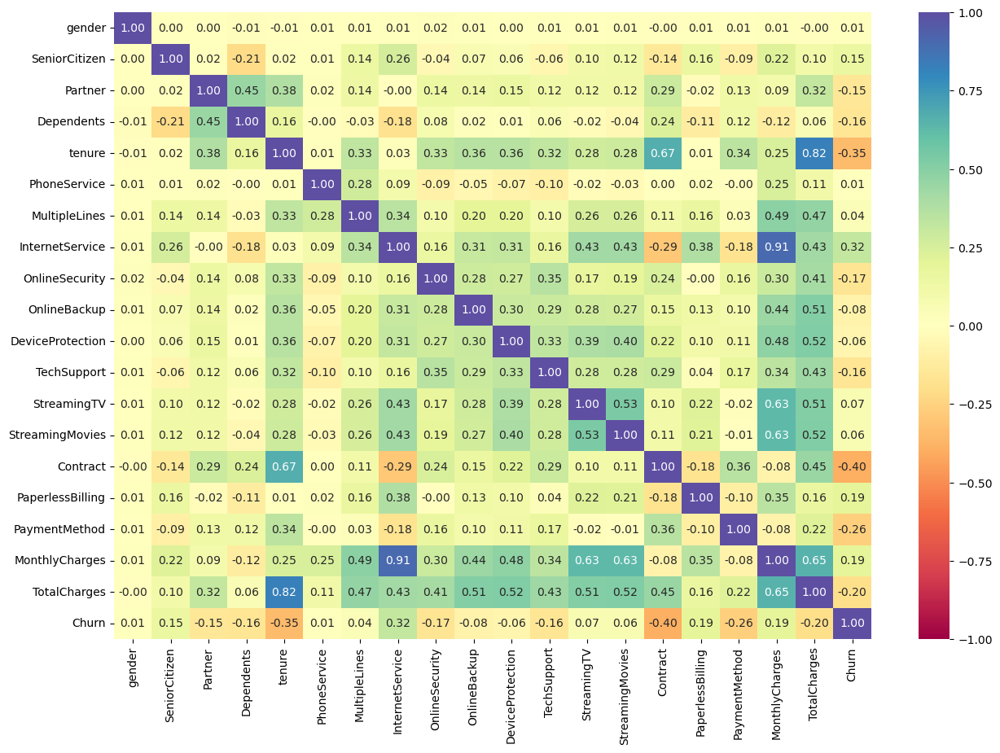

In [26]:

# plot the heatmap

plt.figure(figsize=(15, 10))
sns.heatmap(telecom.corr(), annot = True, vmin = -1, vmax = 1, fmt = ".2f", cmap = "Spectral")
plt.show()

>With the correlation matrix above, we can infer below points:
>1. There is not much correlation between most of the features
>2. Contract and tenure seem to have a relatively strong negative correlation of -0.40 and -0.35 respectively with Churn . This shows that customer with longer contracts and who have been with the compary longer are less likely to churn
>3. There is a strong positive correlation of 0.91 between MonthlyCharges and InternetServices which is likely because certain types of internet services (e.g., fiber optic) cost more
>4. TotalCharges and Tenure also show a strong positive correlation of 0.82 which is logical as longer tenure would lead to higher total charges accumulated over time
>5. There is a slight negative correlation between being a Senior Citizen and having Dependents (-0.21). This makes sense as senior citizens are less likely to have dependents at home
>6. A strong correlation of 0.53 between StreamingTV and StreamingMovies indicates that customers who subscribe to one streaming service are very likely to subscribe to the other. Bundling these services could effectively enhance customer satisfaction and retention

### **SOLUTION (2 F.)**

In [27]:
# Splitting data into X and Y

X = telecom.drop('Churn',axis = 1)  # All independent variables (i.e., excluding 'Churn' as that is target variable)
y = telecom['Churn'] # Target variable

In [28]:
print("Shape of X -->", X.shape)
X.head()

Shape of X --> (7021, 19)


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,1,0,1,0,1.0,0,0,1,0,1,0,0,0,0,0,1,0,29.85,29.85
1,0,0,0,0,34.0,1,0,1,1,0,1,0,0,0,1,0,1,56.95,1889.50
2,0,0,0,0,2.0,1,0,1,1,1,0,0,0,0,0,1,1,53.85,108.15
3,0,0,0,0,45.0,0,0,1,1,0,1,1,0,0,1,0,2,42.30,1840.75
4,1,0,0,0,2.0,1,0,2,0,0,0,0,0,0,0,1,0,70.70,151.65


In [29]:
print("Shape of y -->", y.shape[0])
y.head()

Shape of y --> 7021


0    0
1    0
2    1
3    0
4    1
Name: Churn, dtype: int64

In [30]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

# Print the shapes of the train and test sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape[0])
print("Shape of y_test:", y_test.shape[0])

Shape of X_train: (5616, 19)
Shape of X_test: (1405, 19)
Shape of y_train: 5616
Shape of y_test: 1405


### **SOLUTION (2 G.)**

>To get the best approach to normalize/standardize the data, let's first see what apporaches we have to do this. We can use either **Min-Max Scaling** or **Standard Scaler**.

>Let's use both and determine which of these give better results with different models. Since we are mostly using ensemble techniques such as Descision tree, Random Forest, Boosting, etc. to check performance on train and test data, we'll be checking the accuracy on those to determine the best fit. 

>Along with them, we will also be using few other models to determine accuracy across various others as well

In [31]:
# Initializing the scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Using Standard Scaler
X_train_standard = standard_scaler.fit_transform(X_train)
X_test_standard = standard_scaler.transform(X_test)

# Using Min-Max Scaler
X_train_minmax = minmax_scaler.fit_transform(X_train)
X_test_minmax = minmax_scaler.transform(X_test)

# Defining models

models = {
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'GradientBoost': GradientBoostingClassifier(),
    'SVM': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Logistic Regression': LogisticRegression()
}

# Evaluate models with Standard Scaler
print("Performance with Standard Scaler:")
for model_name, model in models.items():
    model.fit(X_train_standard, y_train)
    y_pred = model.predict(X_test_standard)
    accuracy = accuracy_score(y_test, y_pred)
    print(f'    {model_name} Accuracy: {accuracy:.4f}')

# Evaluate models with Min-Max Scaler
print("\nPerformance with Min-Max Scaler:")
for model_name, model in models.items():
    model.fit(X_train_minmax, y_train)
    y_pred = model.predict(X_test_minmax)
    accuracy = accuracy_score(y_test, y_pred)
    print(f'    {model_name} Accuracy: {accuracy:.4f}')

Performance with Standard Scaler:
    Random Forest Accuracy: 0.7858
    Decision Tree Accuracy: 0.7274
    AdaBoost Accuracy: 0.8000
    GradientBoost Accuracy: 0.8000
    SVM Accuracy: 0.7964
    K-Nearest Neighbors Accuracy: 0.7601
    Logistic Regression Accuracy: 0.7957

Performance with Min-Max Scaler:
    Random Forest Accuracy: 0.7943
    Decision Tree Accuracy: 0.7217
    AdaBoost Accuracy: 0.8000
    GradientBoost Accuracy: 0.8000
    SVM Accuracy: 0.7915
    K-Nearest Neighbors Accuracy: 0.7673
    Logistic Regression Accuracy: 0.7972


>Seeing the Accuracy of both, we notice a minimal difference in performance of both the scalers and hence both seem to be viable options. However, seeing the consistent accuracy across all models and considering our dataframe, we see below pointe:
> * Standard Scaler performs better across most of the models
> * It is also a good option to consider here because our dataset is not much normally distributed
> * It is also considered a good approach when considering ensemble techniques
 >
>Taking above into consideration, we'll be moving forward with ***Standard Scaler*** option as the best apporach here

In [32]:
# Standardizing the telecom dataframe

telecom_standardized = pd.DataFrame(standard_scaler.fit_transform(telecom), columns = telecom.columns)

telecom_standardized.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,1.008726,-0.440508,1.031400,-0.655475,-1.282728,-3.048725,-0.856493,-0.288968,-0.635326,1.374951,-0.725697,-0.640850,-0.792144,-0.798109,-0.830396,0.829057,-1.145750,-1.164135,-0.997328,-0.599671
1,-0.991349,-0.440508,-0.969556,-0.655475,0.062387,0.328006,-0.856493,-0.288968,1.573996,-0.727299,1.377985,-0.640850,-0.792144,-0.798109,0.368496,-1.206190,-0.276095,-0.262811,-0.176347,-0.599671
2,-0.991349,-0.440508,-0.969556,-0.655475,-1.241967,0.328006,-0.856493,-0.288968,1.573996,1.374951,-0.725697,-0.640850,-0.792144,-0.798109,-0.830396,0.829057,-0.276095,-0.365914,-0.962760,1.667582
3,-0.991349,-0.440508,-0.969556,-0.655475,0.510759,-3.048725,-0.856493,-0.288968,1.573996,-0.727299,1.377985,1.560427,-0.792144,-0.798109,0.368496,-1.206190,0.593561,-0.750058,-0.197869,-0.599671
4,1.008726,-0.440508,-0.969556,-0.655475,-1.241967,0.328006,-0.856493,0.996737,-0.635326,-0.727299,-0.725697,-0.640850,-0.792144,-0.798109,-0.830396,0.829057,-1.145750,0.194503,-0.943556,1.667582


***
***
## QUESTION 3


<br>

> Before starting with the next parts, let's create some functions so we don't have to repeat the lines of code

---

In [33]:
# Create Confusion Matrix
def plot_confusion_matrix(conf_matrix_train, conf_matrix_test):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    sns.heatmap(conf_matrix_train, annot = True, fmt = 'd', cmap = 'Blues', ax = axes[0])
    axes[0].set_title('Confusion Matrix for Training Set')
    axes[0].set_xlabel('Predicted Labels')
    axes[0].set_ylabel('Actual Labels')
    axes[0].set_xticks(ticks = [0.5, 1.5], labels = ['Not Churn','Churn'])
    axes[0].set_yticks(ticks = [0.5, 1.5], labels = ['Not Churn','Churn'])

    sns.heatmap(conf_matrix_test, annot = True, fmt = 'd', cmap = 'Blues', ax = axes[1])
    axes[1].set_title('Confusion Matrix for Testing Set')
    axes[1].set_xlabel('Predicted Labels')
    axes[1].set_ylabel('Actual Labels')
    axes[1].set_xticks(ticks = [0.5, 1.5], labels = ['Not Churn','Churn'])
    axes[1].set_yticks(ticks = [0.5, 1.5], labels = ['Not Churn','Churn'])
    
    plt.tight_layout()
    plt.show()
    
    print("Confusion Matrix for Final Training Set:\n", conf_matrix_train)
    print("Confusion Matrix for Final Testing Set:\n", conf_matrix_test)

In [34]:
# Create Evaluation Metrics for checking performance of the model
def evaluation_metrics(y_train, y_train_pred, y_test, y_test_pred, conf_matrix_train, conf_matrix_test):
    
    # Compute evaluation metrics for training set
    accuracy_train = accuracy_score(y_train, y_train_pred)
    precision_train = precision_score(y_train, y_train_pred)
    recall_train = recall_score(y_train, y_train_pred)
    f1_train = f1_score(y_train, y_train_pred)
    
    # Compute evaluation metrics for testing set
    accuracy_test = accuracy_score(y_test, y_test_pred)
    precision_test = precision_score(y_test, y_test_pred)
    recall_test = recall_score(y_test, y_test_pred)
    f1_test = f1_score(y_test, y_test_pred)
    
    # Print evaluation metrics on train set
    print("Training Set:")
    print("    Accuracy:", format(accuracy_train, '.3f'))
    print("    Recall:", format(recall_train, '.3f'))
    print("    Precision:", format(precision_train, '.3f'))
    print("    F1 Score:", format(f1_train, '.3f'))
    
    # Print evaluation metrics on test set
    print("Testing Set:")
    print("    Accuracy:", format(accuracy_test, '.3f'))
    print("    Recall:", format(recall_test, '.3f'))
    print("    Precision:", format(precision_test, '.3f'))
    print("    F1 Score:", format(f1_test, '.3f'))
    
    # print("\nClassification Report for Training Set:")
    # print(classification_report(y_train, y_train_pred))
    
    # print("\nClassification Report for Testing Set:")
    # print(classification_report(y_test, y_test_pred))
    
    # Plot confusion matrix
    print("\n Confusion Matrix:")
    plot_confusion_matrix(conf_matrix_train, conf_matrix_test)

In [35]:
# Perform Grid Search on a model

def perform_grid_search(model, parameters, X_train, y_train):
    """
    Performs a Grid Search for specific model
    along with time taken to fetch the best parameters
    Input Parameters:
    model: The model on which we need to perform GridSearch
    parameters: The parameters to do grid search
    X_train: Training set of intependent variables
    y_train: Training set of target variable
    """
    
    # Initializing Grid Search
    # verbose = 1 will print the log inline while performing the search
    grid_search = GridSearchCV(estimator = model, param_grid = parameters, cv = 5, n_jobs = -1, verbose = 1)

    model_name = model.__class__.__name__.replace('Classifier', '')
    
    # Training the model
    start_time_fit = time.time();
    grid_search.fit(X_train, y_train)
    end_time_fit = time.time();
    
    time_to_fit = end_time_fit - start_time_fit

    # Getting the best parameters found by Grid Search
    best_parameters = grid_search.best_params_
    print(f"Best Parameters found by Grid Search on {model_name} Model - \n       ", best_parameters)
    
    if(time_to_fit < 60):
        print(f"{model_name} Grid Search Tuning Time:", format((time_to_fit), '.2f'), "seconds") 
    else:
        print(f"{model_name} Grid Search Tuning Time:", format((time_to_fit/60), '.2f'), "minutes") 
    
    return grid_search

In [36]:
## Calculating feature importance based on the model
def check_feature_importance(best_model, X_train):
    '''
    
    '''
    ## Calculating feature importance 
    
    feature_importances = best_model.feature_importances_
    model_name = best_model.__class__.__name__.replace('Classifier', '')

    # Create a DataFrame for visualization
    feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances}).sort_values(by = 'Importance', ascending = False)

    plt.figure(figsize=(15, 8))
    sns.barplot(feature_importance_df, color = 'green', x = 'Feature', y = 'Importance')
    plt.title(f"Feature Importance for Telecom ({model_name})")
    plt.xticks(rotation = 90)
    plt.show()


                                                ***--- END OF FUNCTIONS ---***

### **SOLUTION (3 A.)**

In [37]:
# Initializing Decision Tree Classifier
decision_tree = DecisionTreeClassifier(criterion = 'gini', random_state = 42)
decision_tree

DecisionTreeClassifier(random_state=42)

In [38]:
# Train the model on training set
decision_tree.fit(X_train_standard, y_train)

DecisionTreeClassifier(random_state=42)

In [39]:
# Predicting the train and test set

y_train_pred = decision_tree.predict(X_train_standard)
y_test_pred = decision_tree.predict(X_test_standard)

In [40]:
print("Decision Tree Performance --->")
print("    Train Accuracy: ", decision_tree.score(X_train_standard, y_train))
print("    Test Accuracy: ", decision_tree.score(X_test_standard, y_test))

Decision Tree Performance --->
    Train Accuracy:  0.9973290598290598
    Test Accuracy:  0.7295373665480427


Training Set:
    Accuracy: 0.997
    Recall: 0.990
    Precision: 1.000
    F1 Score: 0.995
Testing Set:
    Accuracy: 0.730
    Recall: 0.466
    Precision: 0.461
    F1 Score: 0.463

 Confusion Matrix:


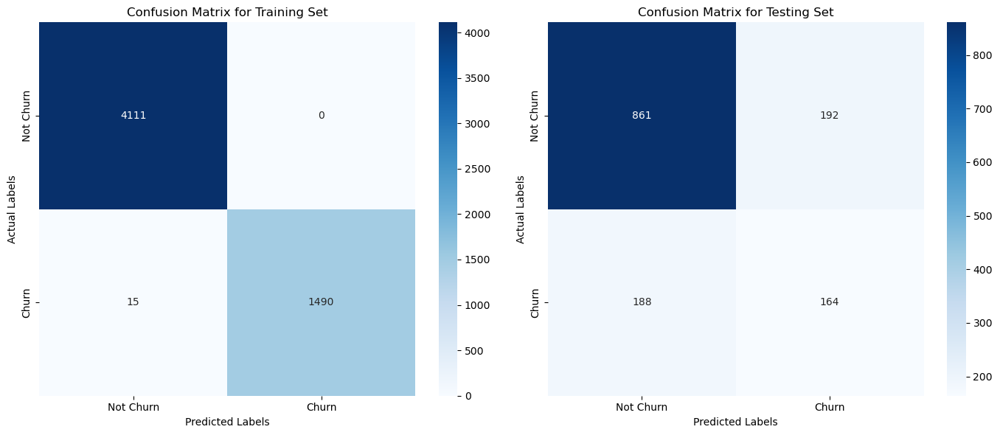

Confusion Matrix for Final Training Set:
 [[4111    0]
 [  15 1490]]
Confusion Matrix for Final Testing Set:
 [[861 192]
 [188 164]]


In [41]:
# Evaulating the performance of the model on train and test set

conf_matrix_train = confusion_matrix(y_train, y_train_pred)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

evaluation_metrics(y_train, y_train_pred, y_test, y_test_pred, conf_matrix_train, conf_matrix_test)

>Now, we see there is a large difference between train and test scores which implies that the decision tree model is highly overfitted.
>
>We can prune it by limiting the maximum depth of the tree and then try to find the accuracy. 
><br>We can choose our own parameters to prune the model however, we have a subsequent part where we are using grid Search to find the best parameters to improve the performance of decision tree. 
><br>So we would be proceeding with Grid Search to automatically find the best parameters to reduce overfitting of data in our model

>This shall be done in the following part

>Now let's visualize the Basic Decision Tree (Overfitted) we got from above

In [42]:
X_train_standard_df = pd.DataFrame(X_train_standard, columns = X_train.columns)

In [43]:
os.environ["PATH"] += os.pathsep + 'C:/Users/pri96/Downloads/windows_10_cmake_Release_Graphviz-10.0.1-win64/Graphviz-10.0.1-win64/bin'

train_char_label = ['No', 'Yes']
dot_data = StringIO()
export_graphviz(decision_tree, out_file = dot_data, filled = True, feature_names = X_train_standard_df.columns, class_names = list(train_char_label), proportion = False)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Telecom_decision_tree.jpg")
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.552731 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.552731 to fit



>This image is very complex. Please zoom to see the data

>Let's also start storing the accuracy results from each model in one dataframe to have a better final comparison later

In [44]:
accuracy_DT_train = accuracy_score(y_train, y_train_pred)
accuracy_DT_test = accuracy_score(y_test, y_test_pred)

final_comparison = pd.DataFrame({'Method': ['Decision Tree'],
                                 'Accuracy(Training Set)': format(accuracy_DT_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_DT_test, '.4f')})
final_comparison.style.set_properties(**{'text-align': 'center'}).set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}])

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295


### **SOLUTION (3 B.)**

In [45]:
# Using Grid Search to check performance of the Decision Tree with different hyperparameters

# Parameter grid for Grid Search
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, 10], # maximim depth of the decision tree
    'min_samples_split': [2, 5, 10, 15], # these are the maximim number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 5, 10], # minimum number of samples required to be at the tree node
    'max_features': ['auto', 'sqrt', 'log2'], # this sets the maximum number of features to be considered for splitting
    'max_leaf_nodes': [None, 5, 10, 20, 30] #this is the maximum number of leaf nodes for decision tree
}

# Performing Grid Search
grid_search_decision_tree = perform_grid_search(decision_tree, param_grid, X_train_standard, y_train)

Fitting 5 folds for each of 1920 candidates, totalling 9600 fits
Best Parameters found by Grid Search on DecisionTree Model - 
        {'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'max_leaf_nodes': 30, 'min_samples_leaf': 10, 'min_samples_split': 2}
DecisionTree Grid Search Tuning Time: 8.51 seconds


>Conclusing on the best parameters to prune the overfit decision tree, we see below to be used:
>- 'max_depth' = 10
>- 'max_features' = 'auto'
>- 'max_leaf_nodes' = 30
>- 'min_samples_leaf' = 10
>- 'min_samples_split'= 2
>- 'criterion' = 'gini'
>
>We will be using these parameters to prune out overly fitted Decision Tree

In [46]:
best_decision_tree = grid_search_decision_tree.best_estimator_
best_decision_tree.fit(X_train_standard, y_train)

DecisionTreeClassifier(max_depth=10, max_features='auto', max_leaf_nodes=30,
                       min_samples_leaf=10, random_state=42)

In [47]:
y_train_pred_pruned = best_decision_tree.predict(X_train_standard)
y_test_pred_pruned = best_decision_tree.predict(X_test_standard)


print("Pruned Decision Tree Performance --->")
print("    Train Accuracy: ",best_decision_tree.score(X_train_standard, y_train))
print("    Test Accuracy: ", best_decision_tree.score(X_test_standard, y_test))

Pruned Decision Tree Performance --->
    Train Accuracy:  0.8064458689458689
    Test Accuracy:  0.7814946619217081


Training Set:
    Accuracy: 0.806
    Recall: 0.510
    Precision: 0.687
    F1 Score: 0.586
Testing Set:
    Accuracy: 0.781
    Recall: 0.457
    Precision: 0.581
    F1 Score: 0.512

 Confusion Matrix:


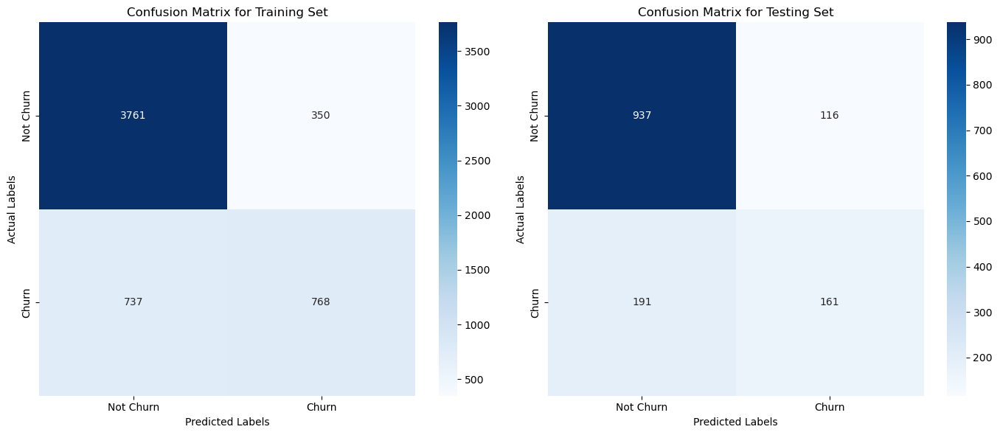

Confusion Matrix for Final Training Set:
 [[3761  350]
 [ 737  768]]
Confusion Matrix for Final Testing Set:
 [[937 116]
 [191 161]]


In [48]:
conf_matrix_train_pruned = confusion_matrix(y_train, y_train_pred_pruned)
conf_matrix_test_pruned = confusion_matrix(y_test, y_test_pred_pruned)

evaluation_metrics(y_train, y_train_pred_pruned, y_test, y_test_pred_pruned, conf_matrix_train_pruned, conf_matrix_test_pruned)

In [49]:
X_train_standard_df = pd.DataFrame(X_train_standard, columns = X_train.columns)

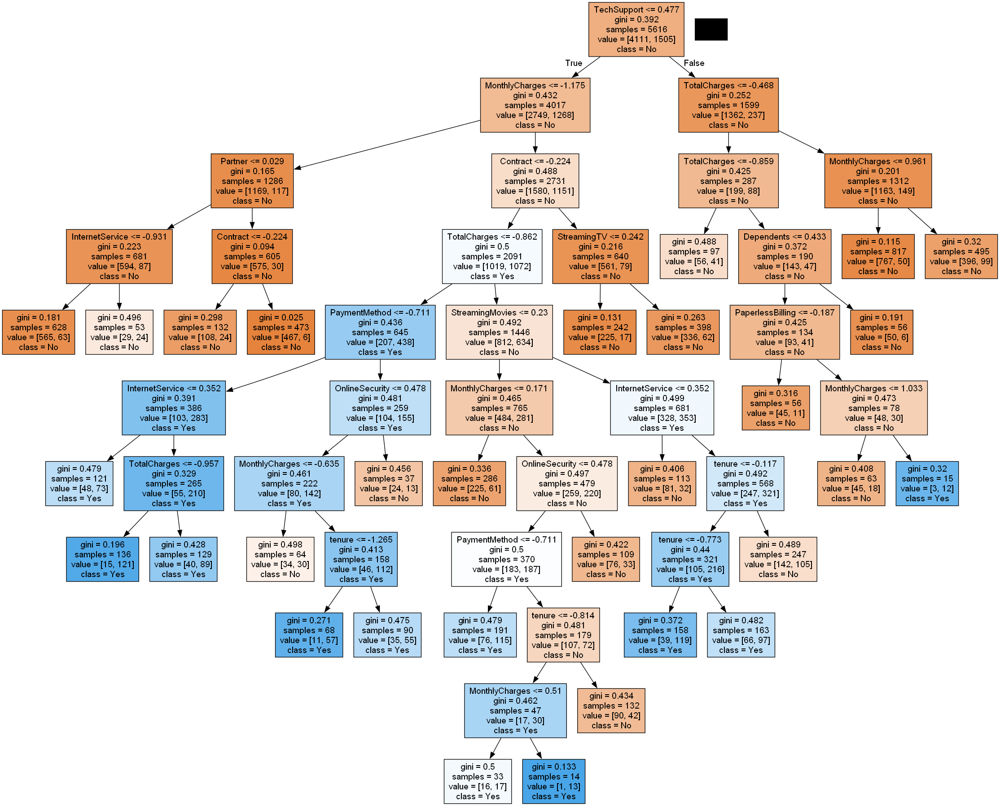

In [50]:
os.environ["PATH"] += os.pathsep + 'C:/Users/pri96/Downloads/windows_10_cmake_Release_Graphviz-10.0.1-win64/Graphviz-10.0.1-win64/bin'

train_char_label = ['No', 'Yes']
dot_data = StringIO()
export_graphviz(best_decision_tree, out_file = dot_data, filled = True, feature_names = X_train_standard_df.columns, class_names = list(train_char_label), proportion = False)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Telecom_decision_tree_pruned.jpg")
Image(graph.create_png())

In [51]:
accuracy_DT_pruned_train = accuracy_score(y_train, y_train_pred_pruned)
accuracy_DT_pruned_test = accuracy_score(y_test, y_test_pred_pruned)

temp_dataframe = pd.DataFrame({'Method': ['Decision Tree (Best Parameters)'],
                                 'Accuracy(Training Set)': format(accuracy_DT_pruned_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_DT_pruned_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815


> Let's check on the importance of each feature in the telecom dataframe

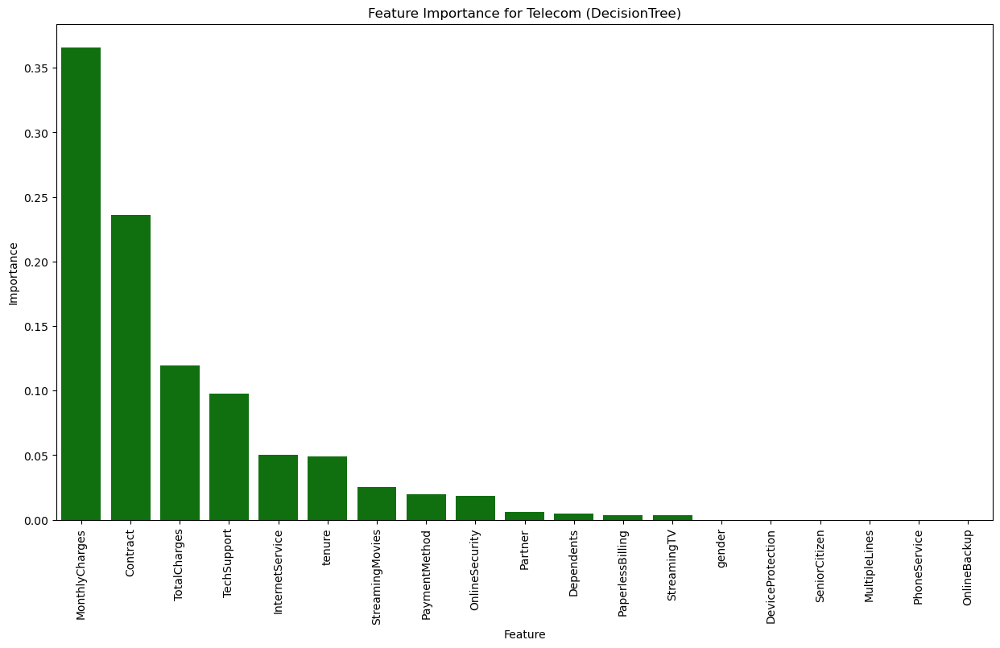

In [52]:
## Calculating feature importance
check_feature_importance(best_decision_tree, X_train)

>Above Bar Plot shows that Contract, InternetService, tenure, MonthlyCharges, TotalCharges, PaymentMethod, phoneService and StreamingMovies contribute to the churning of customers in telecom company.
><br>Company should focus more on getting longer tenure customers in order to reduce the churn rate. 
><br>InternetServices also play an importanmt role in getting customers. Company should have more improvement in that area too. 

>**Comparison of Performance of Solution 3 A and 3 B**<br>
>
> 1. ***Accuracy:***
>     * Before using Grid Search, the model was highly overfitted with very high Accuracy for training set (~100%) and a significant difference with accuracy on testing set with an Accuracy of 73%, however, after grid search, we see that the Accuracy of training and testing set are close to each other
>     * This shows that though the accuracy of training set reduced after grid search, it was for good as this shows that the model was overfitting less post-tuning. 
>     * Also, testing set accuracy (78%) was improved after applying grid search making it cose to the training set accuracy (80.7%)
>     * This is a sign of good performance overall in terms of accuracy<br>
> <br>
> 2. ***Recall, Precision, F1-Score:***
>     * Before using grid search, we see a very significant difference in values for the 3 metrics when compared for training and testing set where training set recall, precision and f1-score valuing close to 100% which again shows a sign of overfitted model
>     * After using Grid Search, we see lower value for recall however an increase in the values for precision and f1-score for testing set
>     * This implies that the overall performance of the model has improved given that there is a very less difference in the training and tetsing set for the 3 metrics<br>
> <br>    
> 3. ***Confusion Matrix*** also shows a good progress after using grid search
><br> <br>
>Overall, Grid Search helped the Decision Tree model optimimze it's parameters leading to an improved performance on the testing set and making it comparable with training set

### **SOLUTION (3 C.)**

In [53]:
# Initializing Random Forest Classifier
random_forest = RandomForestClassifier(n_estimators = 10, random_state = 42)
random_forest

RandomForestClassifier(n_estimators=10, random_state=42)

In [54]:
# Train the model on training set
random_forest.fit(X_train_standard, y_train)

RandomForestClassifier(n_estimators=10, random_state=42)

In [55]:
# Predicting the train and test set

y_train_pred_rf = random_forest.predict(X_train_standard)
y_test_pred_rf = random_forest.predict(X_test_standard)

In [56]:
print("Random Forest Performance --->")
print("    Train Accuracy: ", random_forest.score(X_train_standard, y_train))
print("    Test Accuracy: ", random_forest.score(X_test_standard, y_test))

Random Forest Performance --->
    Train Accuracy:  0.9816595441595442
    Test Accuracy:  0.7879003558718861


Training Set:
    Accuracy: 0.982
    Recall: 0.941
    Precision: 0.990
    F1 Score: 0.965
Testing Set:
    Accuracy: 0.788
    Recall: 0.438
    Precision: 0.606
    F1 Score: 0.508

 Confusion Matrix:


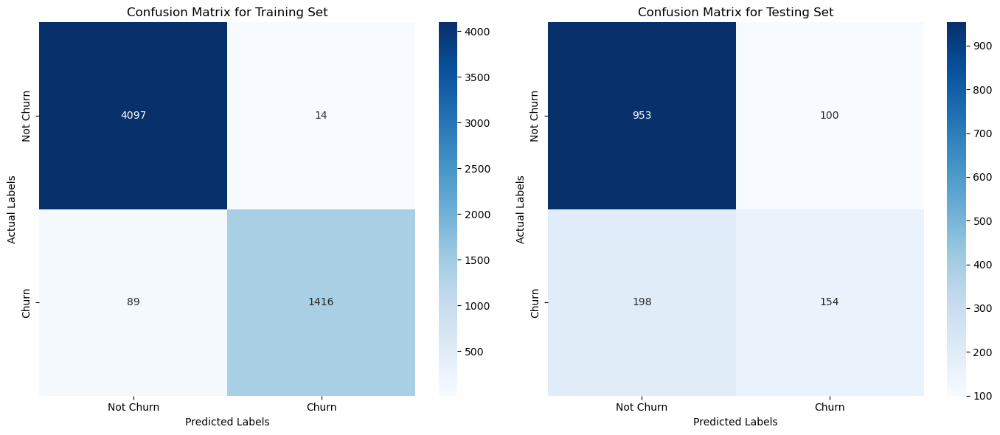

Confusion Matrix for Final Training Set:
 [[4097   14]
 [  89 1416]]
Confusion Matrix for Final Testing Set:
 [[953 100]
 [198 154]]


In [57]:
# Evaulating the performance of the model on train and test set

conf_matrix_train_rf = confusion_matrix(y_train, y_train_pred_rf)
conf_matrix_test_rf = confusion_matrix(y_test, y_test_pred_rf)

evaluation_metrics(y_train, y_train_pred_rf, y_test, y_test_pred_rf, conf_matrix_train_rf, conf_matrix_test_rf)

>Let's Visualize one of the trees from Random Forest

In [58]:
train_char_label = ['No', 'Yes']
dot_data = StringIO()
export_graphviz(random_forest.estimators_[0], out_file = dot_data, filled = True, feature_names = X_train_standard_df.columns, class_names = list(train_char_label), proportion = False)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Telecom_Random_Forest.jpg")
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.520318 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.520318 to fit



>This image is very complex. Please zoom to see the data

>With above performance results, we can infer below points:
> * Random Forest model is performing exceptionally well on the training set, given that all the parameters, accuracy, recall, precision and f1-score, are more than 90%
> * On the other hand, while the model performs very well on the accuracy, we see a big difference of 20% between training and test set. There is a so a noticeable drop in recall, precision and f1-score, showing the model is overfitted with the current parameters in place
> * The complexity of above image for one of the trees from random forest show that it is highly overfitted and we see the same from performance metrics of random forest
>
>The model needs to further tune itself to perform better with both training and testing data and have closer values for accuracy. For this, heperparameters would need to be explored. 
>
>We shall do this hyperparameter tuning in following part

>Let's store the accuracy results for final comparison

In [59]:
accuracy_RF_train = accuracy_score(y_train, y_train_pred_rf)
accuracy_RF_test = accuracy_score(y_test, y_test_pred_rf)

temp_dataframe = pd.DataFrame({'Method': ['Random Forest'],
                                 'Accuracy(Training Set)': format(accuracy_RF_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_RF_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879


### **SOLUTION (3 D.)**

In [60]:
# Using Grid Search to check performance of Random Forest with different hyperparameters

# Parameter grid for Grid Search
param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20], # maximum depth of the random forest
    'min_samples_split': [2, 5, 10], # these are the maximim number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4, 5], # minimum number of samples required to be at the tree node
    'max_features': ['auto', 'sqrt'], # this sets the maximum number of features to be considered for splitting
    'max_leaf_nodes': [None, 10, 20] #this is the maximum number of leaf nodes for random forest
}

# Initializing Grid Search
# verbose = 1 will print the log inline while performing the search
grid_search_random_forest = GridSearchCV(estimator = random_forest, param_grid = param_grid, cv = 5, n_jobs = -1, verbose = 1)

# Training the model
start_time_rf_fit = time.time();
grid_search_random_forest.fit(X_train_standard, y_train)
end_time_rf_fit = time.time();

# Getting the best parameters found by Grid Search
best_parameters = grid_search_random_forest.best_params_
print("Best Parameters found by grid Search on Random Forest - \n       ", best_parameters)

print("Random Forest Grid Search Tuning Time:", format((end_time_rf_fit - start_time_rf_fit)/60, '.2f'), "minutes")

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best Parameters found by grid Search on Random Forest - 
        {'criterion': 'entropy', 'max_depth': 10, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
Random Forest Grid Search Tuning Time: 8.92 minutes


>Concluding on the best parameters to prune the overfit random forest, we see below to be used:
>
> - 'n_estimators' = 100
> - 'max_depth' = 10
> - 'max_features' = 'auto'
> - 'max_leaf_nodes' = None
> - 'min_samples_leaf' = 4
> - 'min_samples_split'= 2
> - 'criterion' = 'entropy'
>
>We will be using these parameters to prune our overly fitted Random Forest

In [61]:
# Training the model with the best parameters from above

best_random_forest = grid_search_random_forest.best_estimator_
best_random_forest.fit(X_train_standard, y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, max_features='auto',
                       min_samples_leaf=4, random_state=42)

In [62]:
y_train_pred_rf_tuned = best_random_forest.predict(X_train_standard)
y_test_pred_rf_tuned = best_random_forest.predict(X_test_standard)


print("Pruned Random Forest Performance --->")
print("    Train Accuracy: ",best_random_forest.score(X_train_standard, y_train))
print("    Test Accuracy: ", best_random_forest.score(X_test_standard, y_test))

Pruned Random Forest Performance --->
    Train Accuracy:  0.853988603988604
    Test Accuracy:  0.80711743772242


Training Set:
    Accuracy: 0.854
    Recall: 0.621
    Precision: 0.790
    F1 Score: 0.695
Testing Set:
    Accuracy: 0.807
    Recall: 0.534
    Precision: 0.637
    F1 Score: 0.581

 Confusion Matrix:


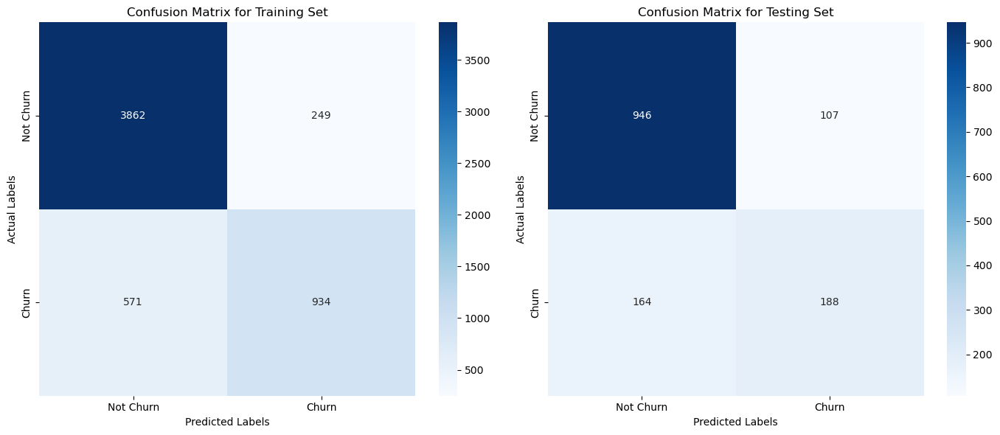

Confusion Matrix for Final Training Set:
 [[3862  249]
 [ 571  934]]
Confusion Matrix for Final Testing Set:
 [[946 107]
 [164 188]]


In [63]:
conf_matrix_train_rf_pruned = confusion_matrix(y_train, y_train_pred_rf_tuned)
conf_matrix_test_rf_pruned = confusion_matrix(y_test, y_test_pred_rf_tuned)

evaluation_metrics(y_train, y_train_pred_rf_tuned, y_test, y_test_pred_rf_tuned, conf_matrix_train_rf_pruned, conf_matrix_test_rf_pruned)

>Let's visualize one of the trees of the Random forest acheived via grid Search

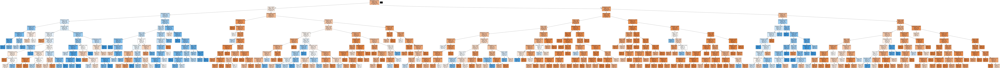

In [64]:
train_char_label = ['No', 'Yes']
dot_data = StringIO()
export_graphviz(best_random_forest.estimators_[20], out_file = dot_data, filled = True, feature_names = X_train_standard_df.columns, class_names = list(train_char_label), proportion = False)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Telecom_Random_Forest_Tuned.jpg")
Image(graph.create_png())

>Let's add it's performance to the final comparison table

In [65]:
accuracy_RF_pruned_train = accuracy_score(y_train, y_train_pred_rf_tuned)
accuracy_RF_pruned_test = accuracy_score(y_test, y_test_pred_rf_tuned)

temp_dataframe = pd.DataFrame({'Method': ['Random Forest (Best Parameters)'],
                                 'Accuracy(Training Set)': format(accuracy_RF_pruned_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_RF_pruned_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071


>Let's check on the importance of each feature in the telecom dataframe from Random Forest

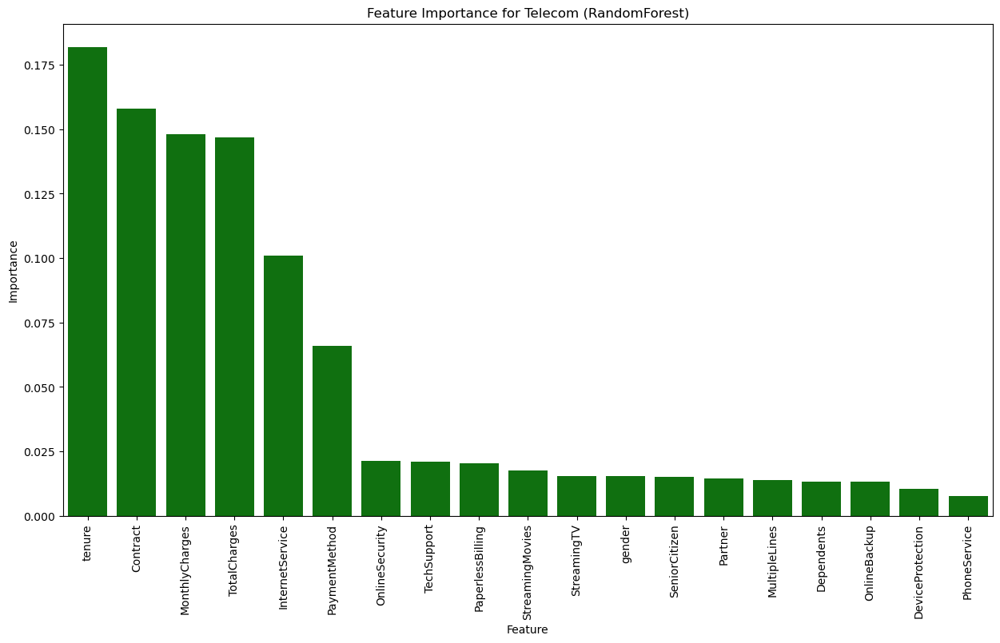

In [66]:
## Calculating feature importance 
check_feature_importance(best_random_forest, X_train)

>Unlike Decision Tree, Random Forest shows highest importance for the longetivity of the customer's association to the company in order to reduce the churn rate as it shows 'tenure' and 'Contract' being the highest importance features.
><br> Next in line are 'MonthlyCharges' and 'TotalCharges' being of almost equal importance to sustain customers to the company which is valid as the charges hold importance to the company.

>**Comparison of Performance of Solution 3 C and 3 D**<br>
> 1. ***Performance on Training Set:***
>     * Before Grid Search, the model performed exceptionally well on training set. We can see very high values for accuracy, recall, precision and f1-score. However, these high metrics indicate overfittingfor the model
>     * In opposite case, after Grid Search, the overall performance of the training set has reduced significantly. We can expect this as the model is now less overfitted and lower metrics indicate realistic performance
>     <br><br>
> 2. ***Peformance on Testing Set:***
>     * Before Grid Search, the model performance is very less on testing set when compared to training set, indicating overfitting. The recall is very low (~43.8%), which says that the model misses a significant number of positive cases
>     * Whereas, after Grid Search, the accuracy on testing set has increased significantly (80%) making it close to the training set accuracy (85.4%). The recall has also improved which tells that the model is now performing good at identifying positive cases
>     <br><br>
> 3. ***Confusion Matrix*** also has very few false positive and false negative cases on training set and a large number of false positive and false negative on testing set, indicating overfitting. While after Grid Search, there is a reduction of false positives and false negatives on testing set and increase on the training set which shows a better analysis of data
><br> <br>
>Overall, Grid Search helped the Random Forest model optimimze it's parameters leading to an improved performance on the testing set and making it comparable with training set, which is very crucial for a reliable model.

### **SOLUTION (3 E.)**

In [67]:
# Initializing AdaBoost model

adaboost = AdaBoostClassifier(n_estimators = 100, random_state = 42)
adaboost

AdaBoostClassifier(n_estimators=100, random_state=42)

In [68]:
# Train the model on training set
adaboost.fit(X_train_standard, y_train)

AdaBoostClassifier(n_estimators=100, random_state=42)

In [69]:
# Predicting the train and test set

y_train_pred_ab = adaboost.predict(X_train_standard)
y_test_pred_ab = adaboost.predict(X_test_standard)

In [70]:
print("AdaBoost Performance --->")
print("    Train Accuracy: ", adaboost.score(X_train_standard, y_train))
print("    Test Accuracy: ", adaboost.score(X_test_standard, y_test))

AdaBoost Performance --->
    Train Accuracy:  0.8139245014245015
    Test Accuracy:  0.7857651245551601


Training Set:
    Accuracy: 0.814
    Recall: 0.560
    Precision: 0.688
    F1 Score: 0.617
Testing Set:
    Accuracy: 0.786
    Recall: 0.509
    Precision: 0.583
    F1 Score: 0.543

 Confusion Matrix:


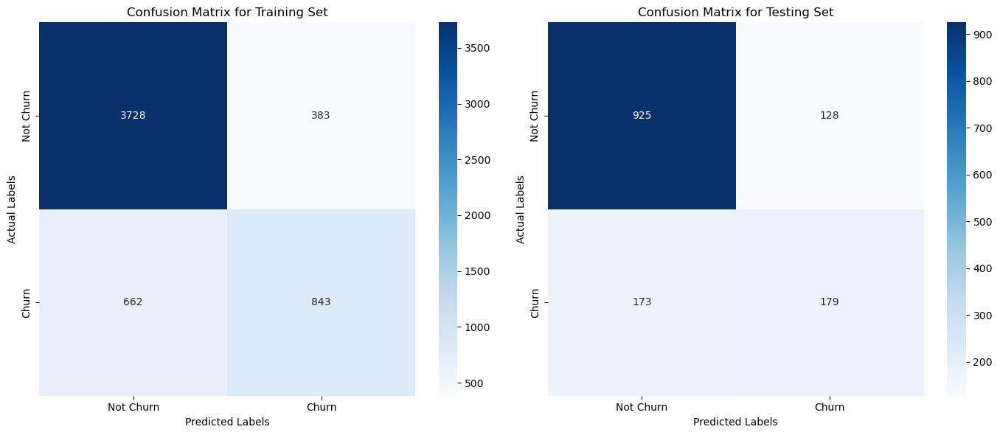

Confusion Matrix for Final Training Set:
 [[3728  383]
 [ 662  843]]
Confusion Matrix for Final Testing Set:
 [[925 128]
 [173 179]]


In [71]:
# Evaulating the performance of the model on train and test set

conf_matrix_train_ab = confusion_matrix(y_train, y_train_pred_ab)
conf_matrix_test_ab = confusion_matrix(y_test, y_test_pred_ab)

evaluation_metrics(y_train, y_train_pred_ab, y_test, y_test_pred_ab, conf_matrix_train_ab, conf_matrix_test_ab)

>We see that the Base AdaBoost model already performs better than othe previous base models as it shows a closed accuracy between training and testing set.
>
>We would, however, go for hyperparameter tuning to see if it improves the accuracy and other performance parameters as though we have a good accuracy comparison on training and test set, other parameters, i.e., precision, f1-score and recall are still having very low values
>
>We shall be doing that in the following part

>Let's now store the accuracy results for final comparison

In [72]:
accuracy_AB_train = accuracy_score(y_train, y_train_pred_ab)
accuracy_AB_test = accuracy_score(y_test, y_test_pred_ab)

temp_dataframe = pd.DataFrame({'Method': ['AdaBoost'],
                                 'Accuracy(Training Set)': format(accuracy_AB_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_AB_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071
0,AdaBoost,0.8139,0.7858


### **SOLUTION (3 F.)**

In [73]:
# Using Grid Search to check performance of the AdaBoost with different hyperparameters

# Parameter grid for Grid Search
param_grid = {
    'n_estimators': [50, 100, 200, 300], # number of estimators
    'learning_rate': [0.01, 0.1, 0.5, 1.0], # contribution of base estimator to the final model
    'algorithm': ['SAMME', 'SAMME.R'] # boosting algorithm to be used
}

grid_search_adaboost = perform_grid_search(adaboost, param_grid, X_train_standard, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
Best Parameters found by Grid Search on AdaBoost Model - 
        {'algorithm': 'SAMME.R', 'learning_rate': 0.1, 'n_estimators': 300}
AdaBoost Grid Search Tuning Time: 12.81 seconds


>Concluding on the best parameters to further increase the performance on our AdaBoost model, we see below to be used:
>
> - 'n_estimators' = 300
> - 'learning_rate' = 0.1
> - 'algorithm' = 'SAMME.R'
>
>We will be using these parameters to tune our AdaBoost model

In [74]:
# Training the model with the best parameters from above

best_adaboost = grid_search_adaboost.best_estimator_
best_adaboost.fit(X_train_standard, y_train)

AdaBoostClassifier(learning_rate=0.1, n_estimators=300, random_state=42)

In [75]:
y_train_pred_ab_tuned = best_adaboost.predict(X_train_standard)
y_test_pred_ab_tuned = best_adaboost.predict(X_test_standard)


print("Tuned AdaBoost Model Performance --->")
print("    Train Accuracy: ",best_adaboost.score(X_train_standard, y_train))
print("    Test Accuracy: ", best_adaboost.score(X_test_standard, y_test))

Tuned AdaBoost Model Performance --->
    Train Accuracy:  0.8092948717948718
    Test Accuracy:  0.799288256227758


Training Set:
    Accuracy: 0.809
    Recall: 0.547
    Precision: 0.679
    F1 Score: 0.606
Testing Set:
    Accuracy: 0.799
    Recall: 0.523
    Precision: 0.617
    F1 Score: 0.566

 Confusion Matrix:


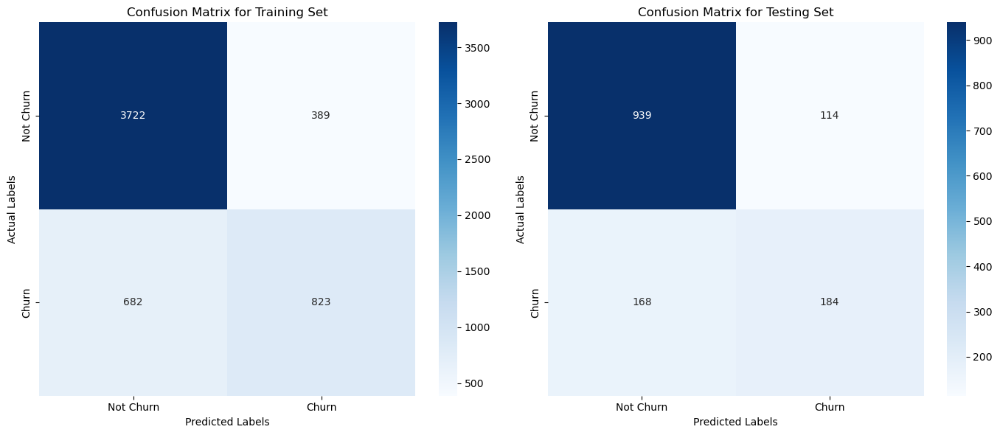

Confusion Matrix for Final Training Set:
 [[3722  389]
 [ 682  823]]
Confusion Matrix for Final Testing Set:
 [[939 114]
 [168 184]]


In [76]:
conf_matrix_train_ab_tuned = confusion_matrix(y_train, y_train_pred_ab_tuned)
conf_matrix_test_ab_tuned = confusion_matrix(y_test, y_test_pred_ab_tuned)

evaluation_metrics(y_train, y_train_pred_ab_tuned, y_test, y_test_pred_ab_tuned, conf_matrix_train_ab_tuned, conf_matrix_test_ab_tuned)

Let's add it's performance to our final comparison

In [77]:
accuracy_AB_pruned_train = accuracy_score(y_train, y_train_pred_ab_tuned)
accuracy_AB_pruned_test = accuracy_score(y_test, y_test_pred_ab_tuned)

temp_dataframe = pd.DataFrame({'Method': ['AdaBoost Model (Best Parameters)'],
                                 'Accuracy(Training Set)': format(accuracy_AB_pruned_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_AB_pruned_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071
0,AdaBoost,0.8139,0.7858
0,AdaBoost Model (Best Parameters),0.8093,0.7993


>Let's now check on the feature importance of out telecom Dataframe from AdaBoost perspective

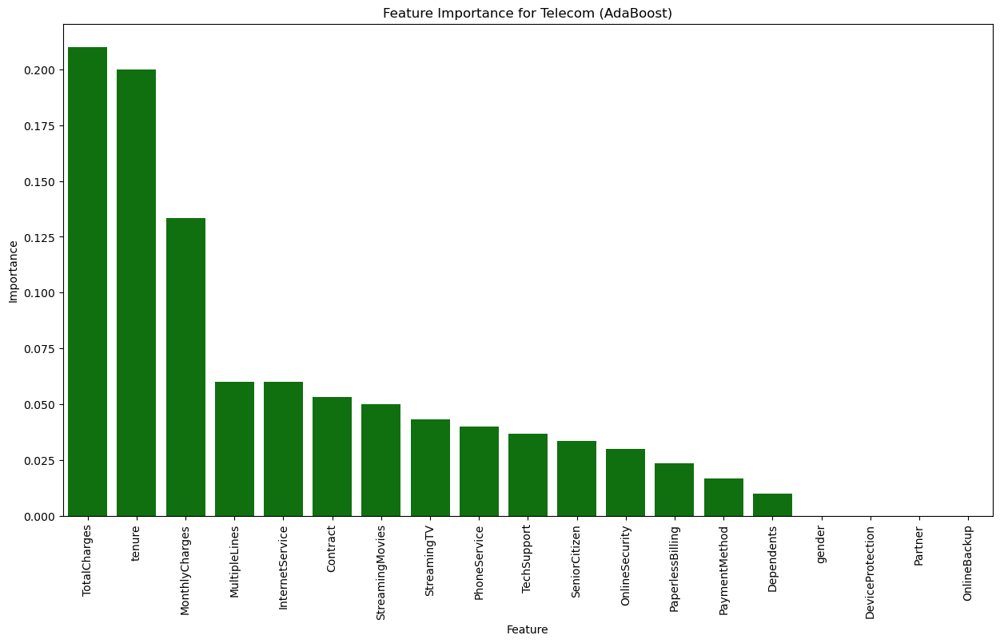

In [78]:
## Calculating feature importance  

check_feature_importance(best_adaboost, X_train)

>The AdaBoost model shows the 'TotalCharges' and 'MonthlyCharges' affecting the customers contributing to the company along with their long term association shown with 'tenure' feature.
><br>For customer retention strategies, gaining insights into why TotalCharges and Tenure are significant can aid in customizing customer engagement and retention initiatives.
>
>The next few features 'MultipleLines', 'InternetService', 'Contract', 'StreamingMovies', and 'StreamingTV' moderately contribute to company's growth but are also significantly important.

>**Comparison of Performance of Solution 3 E and 3 F**<br>
> 1. ***Performance on Training Set</u>:***
>     * *<u>Accuracy</u>:* There is a slight drop in accuracy after using grid search which shows that the adaboost model before grid search was slightly overfitted
>     * *<u>Recall</u>:* The recall also has decreased, which indicates a slight drop in model's ability to correctly identify positive cases
>     * *<u>Precision</u>:* This has decreased which shows a small reduction in the proportion of positive identifications that were actually correct
>     * *<u>F1-Score</u>:* As we see above that recall and precision have a drop in their values, it has impacted the overall F1-Score as well
>     <br><br>
> 2. ***Peformance on Testing Set</u>:***
>     * *<u>Accuracy</u>:* It has improved after using grid search which shows a better generalization as it comes close to that of the training set
>     * *<u>Recall</u>:* The recall also has improved for testin set after using grid search indicating the model's ability to correctly identify positive cases
>     * *<u>Precision</u>:* The precision has improved showing a better the proportion of positive identifications that were actually correct
>     * *<u>F1-Score</u>:* The overall F1-Score has improved owing to improved recall and precision on testing set
>     <br><br>
>Overall, Grid Search helped the AdaBoost model optimimze it's parameters leading to an improved performance on the testing set. Though there were small dips observed for training set after using hyper-parameter tuning, it seems to be a reasonable trade-off as the testing set performance has improved showing a better generatization, which is very crucial for a reliable model.

### **SOLUTION (3 G.)**

In [79]:
# Initializing GradientBoost model
gradient_boost = GradientBoostingClassifier(n_estimators = 200, random_state = 42)
gradient_boost

GradientBoostingClassifier(n_estimators=200, random_state=42)

In [80]:
# Train the model on training set
gradient_boost.fit(X_train_standard, y_train)

GradientBoostingClassifier(n_estimators=200, random_state=42)

In [81]:
# Predicting the train and test set

y_train_pred_gb = gradient_boost.predict(X_train_standard)
y_test_pred_gb = gradient_boost.predict(X_test_standard)

In [82]:
print("GradientBoost Performance --->")
print("    Train Accuracy: ", gradient_boost.score(X_train_standard, y_train))
print("    Test Accuracy: ", gradient_boost.score(X_test_standard, y_test))

GradientBoost Performance --->
    Train Accuracy:  0.844017094017094
    Test Accuracy:  0.79288256227758


Training Set:
    Accuracy: 0.844
    Recall: 0.618
    Precision: 0.755
    F1 Score: 0.680
Testing Set:
    Accuracy: 0.793
    Recall: 0.534
    Precision: 0.597
    F1 Score: 0.564

 Confusion Matrix:


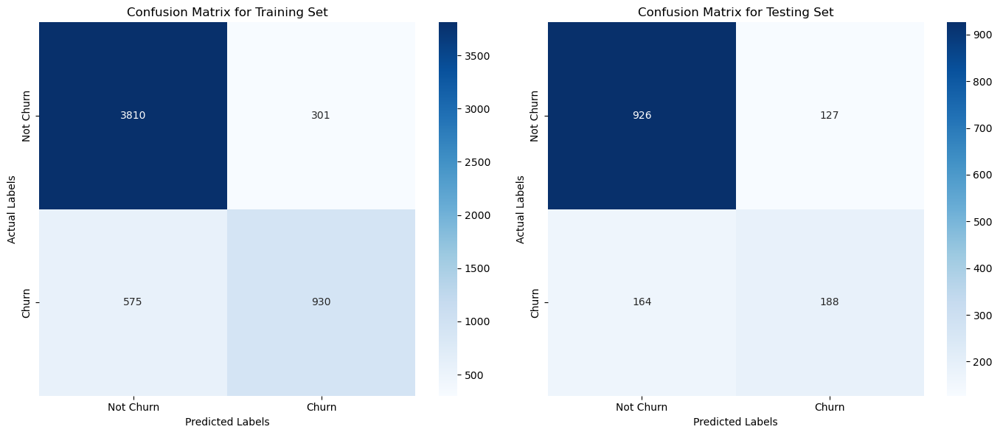

Confusion Matrix for Final Training Set:
 [[3810  301]
 [ 575  930]]
Confusion Matrix for Final Testing Set:
 [[926 127]
 [164 188]]


In [83]:
# Evaulating the performance of the model on train and test set

conf_matrix_train_gb = confusion_matrix(y_train, y_train_pred_gb)
conf_matrix_test_gb = confusion_matrix(y_test, y_test_pred_gb)

evaluation_metrics(y_train, y_train_pred_gb, y_test, y_test_pred_gb, conf_matrix_train_gb, conf_matrix_test_gb)

>We see that the Base GradientBoost model already performs better than other base models such as Decision Tree and Random Forest as:
> * it shows a closed accuracy between training and testing set
> * the base model is less overfitted as compared to Random Forest or Desicion Tree
>
>We would, however, go for hyperparameter tuning to see if it improves the accuracy and other performance parameters as other parameters, i.e., precision, f1-score and recall are still having very low values for testing set
>
>We shall be doing that in the following part

>Let's now store the accuracy results for final comparison

In [84]:
accuracy_GB_train = accuracy_score(y_train, y_train_pred_gb)
accuracy_GB_test = accuracy_score(y_test, y_test_pred_gb)

temp_dataframe = pd.DataFrame({'Method': ['GradientBoost'],
                                 'Accuracy(Training Set)': format(accuracy_GB_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_GB_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071
0,AdaBoost,0.8139,0.7858
0,AdaBoost Model (Best Parameters),0.8093,0.7993
0,GradientBoost,0.8440,0.7929


### **SOLUTION (3 H.)**

In [85]:
# Using Grid Search to check performance of the GradientBoost with different hyperparameters

# Parameter grid for Grid Search
param_grid = {
    'n_estimators': [50, 100, 200, 300], # the number of boosting stages to be run
    'learning_rate': [0.01, 0.1, 0.5, 1.0], # this will reduce the contribution of each tree by the specified amount
    'max_depth': [3, 4, 5], # the maximum depth of individual tree
    'min_samples_split': [2, 5, 10], # the minimum number of samples required to split an internal node. Helps control overfit
    'min_samples_leaf': [1, 2, 4], # the minimum number of samples required to be at a leaf node. Helps control overfitting
    'max_features': ['auto', 'sqrt', 'log2'], # the number of features to consider when looking for the best split
    'subsample': [0.8, 0.9, 1.0] # the fraction of samples to be used for fitting the individual base learners
}

grid_search_gradient_boost = perform_grid_search(gradient_boost, param_grid, X_train_standard, y_train)

Fitting 5 folds for each of 3888 candidates, totalling 19440 fits
Best Parameters found by Grid Search on GradientBoosting Model - 
        {'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100, 'subsample': 1.0}
GradientBoosting Grid Search Tuning Time: 27.04 minutes


>Concluding on the best parameters to further increase the performance on our GradientBoost model, we see below to be used:
>
> - 'n_estimators' = 100
> - 'learning_rate' = 0.1
> - 'max_depth' = 3
> - 'max_features': 'sqrt'
> - 'min_samples_leaf': 2
> - 'min_samples_split': 5
> - 'subsample': 1.0
> 
>We will be using these parameters to tune our AdaBoost model

In [86]:
# Training the model with the best parameters from above

best_gradient_boost = grid_search_gradient_boost.best_estimator_
best_gradient_boost.fit(X_train_standard, y_train)

GradientBoostingClassifier(max_features='sqrt', min_samples_leaf=2,
                           min_samples_split=5, random_state=42)

In [87]:
y_train_pred_gb_tuned = best_gradient_boost.predict(X_train_standard)
y_test_pred_gb_tuned = best_gradient_boost.predict(X_test_standard)


print("Tuned GradientBoost Model Performance --->")
print("    Train Accuracy: ",best_gradient_boost.score(X_train_standard, y_train))
print("    Test Accuracy: ", best_gradient_boost.score(X_test_standard, y_test))

Tuned GradientBoost Model Performance --->
    Train Accuracy:  0.8215811965811965
    Test Accuracy:  0.8


Training Set:
    Accuracy: 0.822
    Recall: 0.569
    Precision: 0.708
    F1 Score: 0.631
Testing Set:
    Accuracy: 0.800
    Recall: 0.531
    Precision: 0.617
    F1 Score: 0.571

 Confusion Matrix:


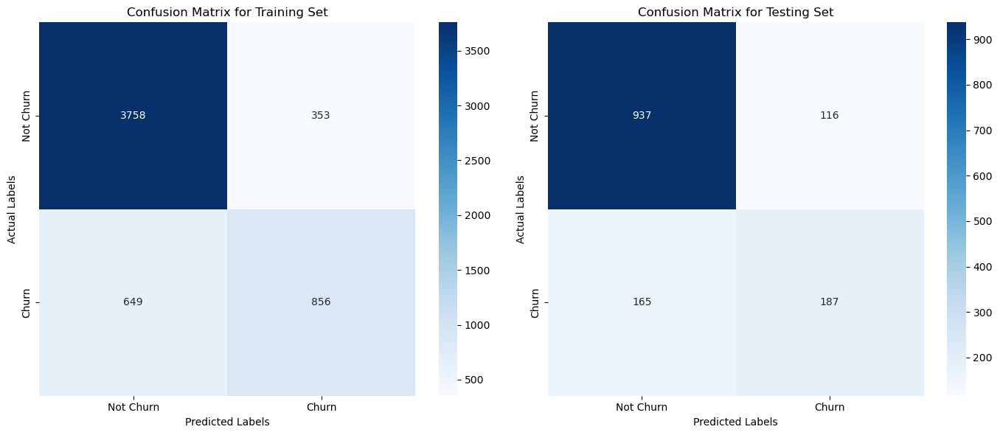

Confusion Matrix for Final Training Set:
 [[3758  353]
 [ 649  856]]
Confusion Matrix for Final Testing Set:
 [[937 116]
 [165 187]]


In [88]:
conf_matrix_train_gb_tuned = confusion_matrix(y_train, y_train_pred_gb_tuned)
conf_matrix_test_gb_tuned = confusion_matrix(y_test, y_test_pred_gb_tuned)

evaluation_metrics(y_train, y_train_pred_gb_tuned, y_test, y_test_pred_gb_tuned, conf_matrix_train_gb_tuned, conf_matrix_test_gb_tuned)

>Let's add this model's performance to our final comparison table

In [89]:
accuracy_GB_tuned_train = accuracy_score(y_train, y_train_pred_gb_tuned)
accuracy_GB_tuned_test = accuracy_score(y_test, y_test_pred_gb_tuned)

temp_dataframe = pd.DataFrame({'Method': ['GradientBoost Model (Best Parameters)'],
                                 'Accuracy(Training Set)': format(accuracy_GB_tuned_train, '.4f'), 
                                 'Accuracy(Testing Set)': format(accuracy_GB_tuned_test, '.4f')})

final_comparison = pd.concat([final_comparison, temp_dataframe])
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071
0,AdaBoost,0.8139,0.7858
0,AdaBoost Model (Best Parameters),0.8093,0.7993
0,GradientBoost,0.8440,0.7929
0,GradientBoost Model (Best Parameters),0.8216,0.8000


Let's now check on the feature importance of out telecom Dataframe from GradientBoost perspective

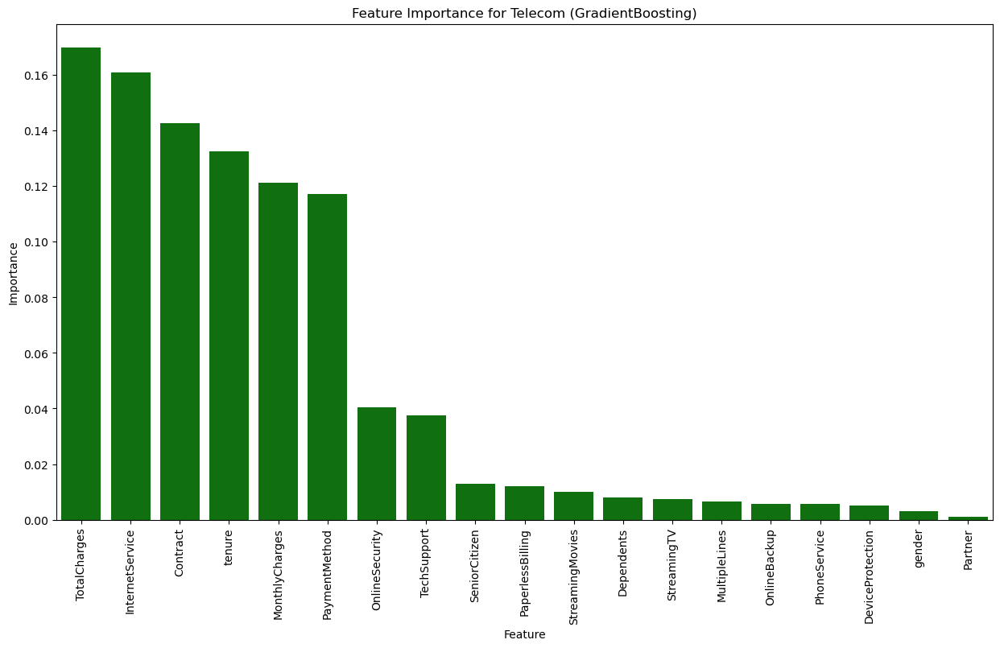

In [90]:
## Calculating feature importance  

check_feature_importance(best_gradient_boost, X_train)

>GradientBoost model shows that 'Contract' and 'tenure' have a high impact on customer churn rate in the Telecom Company. This means customers who are associated with the company for a longer duration are tend to chrun less. 
>
>Along with these 2, 'TotalCharges', 'InternetService' also play a vital role in getting customers to trust the company. The company should focus on improving its internet services to keep a hold on the existing customers and welcom new ones.
>
>Improvement in payment methods when we have monthly charges involved, also plays a cricial role in building a trust from customer's perspective towards the company


>**Comparison of Performance of Solution 3 G and 3 H**<br>
> 1. ***Accuracy:***
>     * <u>Training Set</u> - The accuracy has decreased on the training set after grid search. Since, the drop was less, it can be inferred that the model was slightly overfitted before grid search. It can also state that the overall correctness of the training data has reduced after tuning the model
>     * <u>Testing Set</u> - The accuracy has increased for the testing set after grid search which shows that the model is now more generalized to the test data. 
>     * With increase in accuracy on test set and decrease on the training set after grid search, the values have moved more closer to each other which is a sign of a reliable model
>     <br><br>
>2. ***Precision:***
>     * <u>Training Set</u> - Precision has a decrease on the training set after grid search which shows that the tuned model has a lower proportion in predicting true positive cases. We can see the same in confusion matrix as well
>     * <u>Testing Set</u> - On the other hand, the tuned model is making more correct positive identifications and precision has improved for testing set after grid search
>     <br><br>
>3. ***Recall:***
>     * <u>Training Set</u> - Recall decreased from 0.618 to 0.569 after Grid Search. This indicates the tuned model is slightly less effective in identifying positive cases in the training data
>     * <u>Testing Set</u> - It has slightly decreased from 0.534 to 0.531 after Grid Search, indicating a very minor reduction in identifying positive cases in the testing data. This is also evident in confusion matrix created after grid search
>     <br><br>
>5. ***F1-Score:***
>     * <u>Training Set</u> - It has decreased after grid search and this drop is expected due to the decrease in both Recall and Precision on the training set
>     * <u>Testing Set</u> - The F1 Score is increased after Grid Search, indicating an overall improvement in balancing precision and recall on the testing set
>     <br><br>
>Overall, the model exhibited signs of overfitting with high performance on the training set but lower performance on the testing set before grid search. However, using Grid Search has helped the GradientBoost model in balancing the model's ability to generalize to new data while avoiding overfitting

### **SOLUTION (3 I.)**
> **Part (1)**

Let's analyse and compare the performance of each model, including their tuned versions, in training and testing stage. We shall be using out final comparison table for this

In [91]:
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071
0,AdaBoost,0.8139,0.7858
0,AdaBoost Model (Best Parameters),0.8093,0.7993
0,GradientBoost,0.8440,0.7929
0,GradientBoost Model (Best Parameters),0.8216,0.8000


**Decision Tree:**
 * ***Initial Model -*** The training set accuracy is extremely high (99.7%) which clearly indicates overfitting. It gives the perfect fitting to traning set however it fails to genralize that well on the testing set where accuracy falls to 73%
 * ***Tuned model -*** The training accuracy decreases significantly (80.6%), indicating the model is less overfitted now. The testing accuracy is greatly improved to now 78.1% which shows better generatization on the model
 * The decision tree model is highly prone to overfitting due to its ability to capture intricate patterns in the training data. This is why we see the tuned model perfoming better and improving generalization


**Random Forest:**
 * ***Initial Model -*** The training set accuracy is extremely high (98.17%) which clearly indicates overfitting. The testing set gives a better performance than decision tree however it gets stuck to 78.8% indicating a drop in performance
 * ***Tuned model -*** The training accuracy decreases to 85.4% reducing overfitting along with testing accuracy increased to 80.7% demonstrating a better generalization
 * Random forest model is more robust than decision tree however, it was still overfitted seeing the difference between the training and testing accuracy which can be due to the number of trees or depth was chosen incorrectly. Therefore, it benefitted from hyperparameter tuning by optimizing the number of trees, depth, and other parameters
 <br><br>
 

**AdaBoost:**
 * ***Initial Model -*** Both the training accuracy (81.4%) and testing accuracy (78.6%) are closer to each other in the initial model itself indication a balanced model with good generalization along with a scope of improvement
 * ***Tuned model -*** The training accuracy decreases to 80.9% reducing the slight overfitting initial model possessed along with improving testing accuracy to 79.3% giving a better generalization
 * AdaBoost model is generally resistent to overfitting due to corrections at every stage, howevere, hyperparameter tuning helps fine-tune the learning rate and the number of estimators, improving the model's performance on the testing set
 <br><br>
 
 
**GradientBoost:**
 * ***Initial Model -*** The training accuracy is higher (81.4%) than the testing accuracy (79.2%) which is indicating a slight overfitting
 * ***Tuned model -*** The training accuracy decreases to 82.2% while the testing accuracy improves to 80% showing better generalization
 * GradientBoost model is generally resistent to overfitting due to the sequential correction of errors, howevere, hyperparameter tuning helps fine-tune the learning rate and the number of boosting stages, resulting in a better-performing model on testing data
 <br><br>
 
Comparing overall, all the models performed well on training data, either owing to overfitting or improvement because of tuning but the testing data performance is seen to improve only after hyper tuning where it was performing well on the unseen data and giving more accurate results close to training set

> **Part (2)**

In [92]:
final_comparison

,Method,Accuracy(Training Set),Accuracy(Testing Set)
0,Decision Tree,0.9973,0.7295
0,Decision Tree (Best Parameters),0.8064,0.7815
0,Random Forest,0.9817,0.7879
0,Random Forest (Best Parameters),0.8540,0.8071
0,AdaBoost,0.8139,0.7858
0,AdaBoost Model (Best Parameters),0.8093,0.7993
0,GradientBoost,0.8440,0.7929
0,GradientBoost Model (Best Parameters),0.8216,0.8000


Seeing the above final comparison table, it is clear that in our case, **<u>RANDOM FOREST</u>** performs **best** among all other models when **<u>hyper-tuned to the best parameters</u>**

It shows an overall best accuracy of 85.4% on training set and 80.71% on the testing set balancing well between the performance of both sets

Though GradientBoost model also has an accuracy close to Random Forest, **the time taken to fit the tuned random forest model is also very less (close to 9 minutes)** when compared to GradientBoost model which took more than 27 minutes. So seeing all parameters, Random forest performs best overall.

Let's check on it's evaluation parameters again

Training Set:
    Accuracy: 0.854
    Recall: 0.621
    Precision: 0.790
    F1 Score: 0.695
Testing Set:
    Accuracy: 0.807
    Recall: 0.534
    Precision: 0.637
    F1 Score: 0.581

 Confusion Matrix:


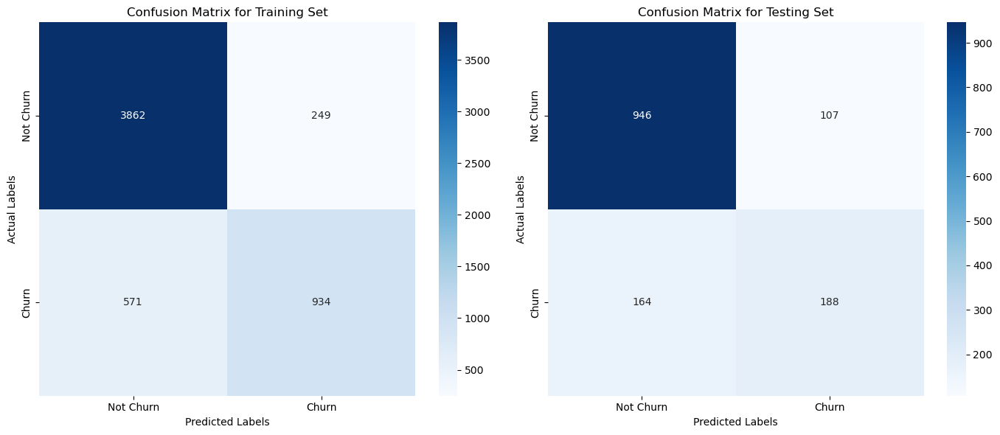

Confusion Matrix for Final Training Set:
 [[3862  249]
 [ 571  934]]
Confusion Matrix for Final Testing Set:
 [[946 107]
 [164 188]]


In [93]:
evaluation_metrics(y_train, y_train_pred_rf_tuned, y_test, y_test_pred_rf_tuned, conf_matrix_train_rf_pruned, conf_matrix_test_rf_pruned)

The confusion matrix also states the same facts. It has a high number of correct classifications for both positive and negative instances, showing that the model leaerned well on the training set.
<br> Yes, it has some false positives and false negatives as well, but the overall accuracy owing to higher number of correct predictions on true positives and true negatives suggest it as a good model.

The testing confusion matrix also shows  a high number of true positives and true negatives. Though, the number of false positives and false negatives indicates areas where the model could improve, but overall, the performance is strong.

> **Part (3)**

There are multiple reasons on why Random Forest works well on our data

 1. It has relatively small gap between training accuracy (85.4%) and testing accuracy (80.7%) suggests that the model generalizes well to testing data and correctly classifies a large proportion of instances<br><br>
 2. There is a higher F1-Score (balance bweteen Precision and Recall) for both training and testing data which tells that it is performing well on imbalanced data. We could check further by balancing the data on further improvement<br><br>
 3. Random Foest has its inherent nature to work on multiple decision trees, combine them and average their result to reduce overfitting. We can see that the initial Decision Tree was highly overfitted and the tuned Random Forest gave a better generalization<br><br>
 4. The number of false negatives (164) and false positives (107) are relatively very low on testing set which show that the model has a good balance in classifying the errors<br><br>
 5. The second best model, **GradientBoost** also has a good accuracy on both training set (82.16%) and testing set (80%) however, they are slightly edged out by the tuned Random Forest in terms of overall accuracy and the balance of precision and recall making random forest the best among all<br><br>
 6. The model achieves an optimal balance overall between bias (by avoiding underfitting) and variance (by avoiding overfitting), leading to robust and reliable performance on both the sets keeping the accuracy scores closer to each other<br><br>


> **Part (4)**

Let's club our final observations with the feature importance of our best predicted model (Tuned Random Forest Model)

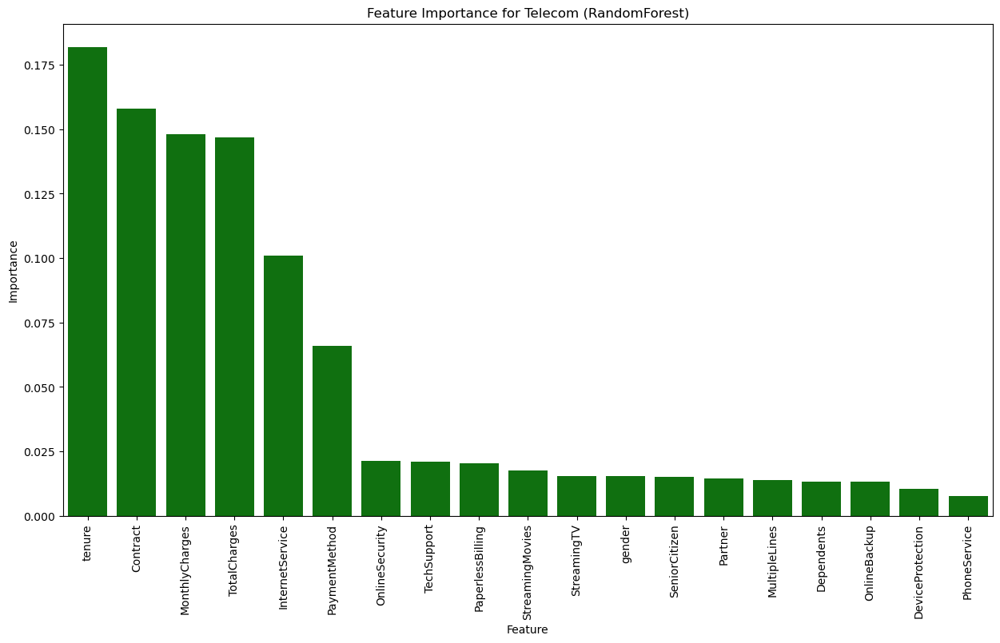

In [94]:
check_feature_importance(best_random_forest, X_train)

Combining overall insights, we see below points:
 * Customer with longer tenure are less likely to churn. We can also see that in the feature importance graph where 'tenure' stands at highest importance among others. Company can implement loyalty programs to encourage long-term customers<br><br>
 * The month-to-month contracts are more common among the second highest importance feature, 'Contract', hwowever, they are also likely to churn more as we have seen previously in pie charts. There can be an introduction of upgrade plans with discounts to engage more customers <br><br>
 * Charges to the customers also play a vital role as we see them next in line in the importance table. Company might need to monitor high-spending customers and provide discounts or personalized offers to prevent churn<br><br>
 * As we proceed further, next features start to have a decreased improtance than others with concentrating on being dependent or senior citizen and gender not playing a significant role in engaging customers. However, these might impact if played on smartly by adding more bundle packages for additional services like device protection, backup, security, etc and introducing family packs<br><br>
 * Coming to our model, we can see clearly that though we have tuned Random Forest asthe best performing model, the tuned GradientBoost model also has a good accuracy. Playing around the hyperparameters for GradientBoost can also help us and company predicting more analysis and developing a good accuracy on the data<br><br>
 * While the models give a good prediction, there is always a room for improvement:
     * We can perform a more detailed data analysis (EDA) to have better correlations on various improtant features
     * We can also create new features from our existing data such as customer lifetime value (tenure and charges can be played upon) to have a better analysis on patterns
     * Company can enhance customer engagement through personalized communication and offers
     * Company also can conduct market analysis along with the current one to understand competitive pricing and service offerings
     
All above points will help in identifying customers who have a higher probability to churn and help the company to lessen the churn rate for such customers and increase customer satisfaction. Afterall, *CUSTOMER IS KING!!! :P ;)*

***
***
**END OF PROJECT**
***
***